# PrimateFace Tutorial: Gaze-Following Heuristic

| GitHub | Paper | Website |
|---|---|---|
| [Code](https://github.com/KordingLab/PrimateFace) | [Preprint](https://www.biorxiv.org/content/10.1101/2025.08.12.669927) | [Project](https://primateface.studio/) |

This tutorial demonstrates a gaze-following heuristic for videos containing two primates.
It uses PrimateFace detection and Gazelle gaze estimation to analyze social attention dynamics.

### This notebook will:
1. Set up the local environment with mmdetection and gazelle.
2. Download pre-trained models for face detection and gaze estimation.
3. Process a two-primate video: detect, track, and estimate gaze.
4. Engineer features: head yaw, gaze uncertainty (cone), relative position.
5. Train and evaluate classifiers to predict gaze-following events.
6. Visualize results: PR curves, gaze dynamics, attention clouds.

### Prerequisites
- PrimateFace conda environment activated (see `demos/README.md`)
- Models downloaded via `python demos/download_models.py`
- GPU recommended (CPU fallback supported but very slow)
- A video with two primates (demo download provided)

## 1. Environment Setup

In [1]:
import sys
from pathlib import Path

sys.path.insert(0, str(Path.cwd()))
from notebook_utils import check_environment, get_device, download_models_hf

env_info = check_environment(require_packages=["mmdet", "gazelle"])
DEVICE = get_device()
print()
print("Using device: " + DEVICE)


PrimateFace Environment
  Python:   3.10.18
  PyTorch:  2.1.0+cu118
  CUDA:     True
  Device:   cuda:0
  GPU:      NVIDIA GeForce RTX 4090 (25.8 GB)
  mmdet: 3.2.0 [OK]
  gazelle: installed [OK]

Using device: cuda:0


In [2]:
from __future__ import annotations
import os, math, warnings, itertools
from pathlib import Path
from collections import deque

import cv2, torch, numpy as np, pandas as pd, matplotlib.pyplot as plt
from tqdm.notebook import tqdm
from scipy.signal import butter, filtfilt
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import TimeSeriesSplit, cross_val_predict
from sklearn.metrics import precision_recall_curve, average_precision_score
from sklearn.svm import LinearSVC, SVC
from sklearn.neural_network import MLPClassifier
from sklearn.model_selection import GridSearchCV
from sklearn.base import clone
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline
from sklearn.ensemble import RandomForestRegressor
from sklearn.linear_model import Ridge
from sklearn.svm import SVR
from sklearn.metrics import r2_score, mean_absolute_error
from sklearn.neural_network import MLPRegressor

from mmdet.apis import init_detector, inference_detector
from mmdet.structures import DetDataSample
from mmdet.models.trackers import ByteTracker
from mmpose.evaluation.functional import nms
from gazelle.model import get_gazelle_model

import matplotlib
matplotlib.use("Agg")

warnings.filterwarnings("ignore")

%matplotlib inline
from notebook_utils import setup_publication_style, save_fig
setup_publication_style()

Publication plot style configured (Nature-style).


## 2. Configuration

In [3]:
NOTEBOOK_DIR = Path.cwd()
DEMOS_DIR = NOTEBOOK_DIR.parent

# Download detection models from HuggingFace (skips if already present)
print("Downloading/checking model files...")
model_paths = download_models_hf(DEMOS_DIR)

DET_CONFIG_PATH = str(model_paths["mmdet_config.py"])
DET_CHECKPOINT_PATH = str(model_paths["mmdet_checkpoint.pth"])

# Gazelle model is loaded separately (not in HF model registry)
GAZELLE_MODEL_NAME = "gazelle_dinov2_vitl14"
GAZELLE_CHECKPOINT_PATH = str(DEMOS_DIR / "gazelle_dinov2_vitl14.pt")
if not Path(GAZELLE_CHECKPOINT_PATH).exists():
    print("WARNING: Gazelle checkpoint not found at " + GAZELLE_CHECKPOINT_PATH)
    print("Download from Google Drive or see demos/download_models.py")
else:
    size_mb = Path(GAZELLE_CHECKPOINT_PATH).stat().st_size / (1024 * 1024)
    print("  Found: gazelle_dinov2_vitl14.pt (" + str(round(size_mb, 1)) + " MB)")

DEFAULT_DET_THRESHOLD = 0.1
print()
print("Device: " + DEVICE)


Downloading/checking model files...


  Already exists: mmdet_config.py (0.0 MB)
  Already exists: mmdet_checkpoint.pth (339.8 MB)
  Already exists: mmpose_config.py (0.0 MB)
  Already exists: mmpose_checkpoint.pth (37.8 MB)
  Already exists: vitpose_config.py (0.0 MB)
  Already exists: vitpose_checkpoint.pth (1192.4 MB)
  Found: gazelle_dinov2_vitl14.pt (12.0 MB)

Device: cuda:0


In [4]:
# Set your video path here
VIDEO_FILE_PATH = r"A:\NonEnclosureProjects\inprep\PrimateFace\data\twin_babies_AdobeStock_258132942.mov"

# Output directory
output_dir = "gaze_following_output"
os.makedirs(output_dir, exist_ok=True)

if not VIDEO_FILE_PATH or not Path(VIDEO_FILE_PATH).exists():
    print("WARNING: Video not found. Please set VIDEO_FILE_PATH to your video.")
    print("Example: VIDEO_FILE_PATH = '/path/to/your/two_primate_video.mp4'")
else:
    print("Video: " + VIDEO_FILE_PATH)
    print("Output: " + output_dir)

Video: A:\NonEnclosureProjects\inprep\PrimateFace\data\twin_babies_AdobeStock_258132942.mov
Output: gaze_following_output


## 3. Helper Functions

The following cells define all analysis functions used by the pipeline.
They are split into logical groups: utilities, video processing, feature
engineering / training, visualization, and attention-cloud / video generation.

In [5]:
# ---------------------------------------------------------------------------
# Utility functions
# ---------------------------------------------------------------------------

def butter_lowpass(data, fps, cutoff=1.0, order=2):
    b, a = butter(order, cutoff/(fps/2), btype='low')
    return filtfilt(b, a, data)


def heatmap_to_unit_vec(hmap: torch.Tensor) -> tuple[np.ndarray, float, np.ndarray]:
    """Returns unit gaze vector in image coords (x right, y down), its raw magnitude, and the raw (unnormalized) gaze vector."""
    h = hmap.detach().cpu().numpy()
    if h.ndim != 2 or h.size == 0:
        return np.array([np.nan, np.nan]), np.nan, np.array([np.nan, np.nan])
    y, x = np.unravel_index(np.argmax(h), h.shape)
    cx, cy = h.shape[1]/2, h.shape[0]/2
    raw_vec = np.array([x - cx, y - cy])
    magnitude = float(np.linalg.norm(raw_vec))
    if magnitude < 1e-5: # Lowered threshold
        return np.array([np.nan, np.nan]), np.nan, raw_vec # Return raw_vec even if magnitude is tiny
    return raw_vec / magnitude, magnitude, raw_vec


def angular_dist(v1, v2):
    dot = np.clip(np.dot(v1, v2), -1, 1)
    return math.degrees(math.acos(dot))

In [6]:
# ---------------------------------------------------------------------------
# Video processing pipeline
# ---------------------------------------------------------------------------

def process_video(path, cfg):
    cap = cv2.VideoCapture(str(path))
    fps = cap.get(cv2.CAP_PROP_FPS) or 30
    frame_count = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))

    # Init models
    det = init_detector(cfg['det_config'], cfg['det_checkpoint'], device=cfg['device'])
    gazelle, gz_tf = get_gazelle_model(cfg['gazelle_model_name'])
    gazelle.load_gazelle_state_dict(torch.load(cfg['gazelle_checkpoint'], map_location=cfg['device']))
    gazelle.to(cfg['device']).eval()

    # Initialize ByteTracker
    tracker = ByteTracker(
        motion=dict(type='KalmanFilter'),
        obj_score_thrs=dict(high=0.6, low=0.1), # Adjusted thresholds, can be tuned
        init_track_thr=0.7, # Higher threshold for initializing a new track
        weight_iou_with_det_scores=True,
        match_iou_thrs=dict(high=0.1, low=0.5, tentative=0.3),
        num_frames_retain=30 
    )
    # stable_id_map maps: {stable_id (0 or 1) : current_bytetracker_id}
    stable_id_map = {0: None, 1: None} 
    # Track which bytetracker IDs have been assigned to a stable ID
    assigned_bytetracker_ids = set() 

    records = []  # list of dict per frame

    for fi in tqdm(range(frame_count)):
        ok, bgr = cap.read()
        if not ok: break
        
        # --- Detection ---
        mm_det_results = inference_detector(det, bgr)
        # Filter raw detections by score first (before tracker)
        pred_instances = mm_det_results.pred_instances[mm_det_results.pred_instances.scores > cfg['det_thr']]
        # Further filter for primate class if your detector has multiple classes (assuming class 0 for primates)
        # monkey_indices = (pred_instances.labels == 0).nonzero(as_tuple=True)[0] # Example if class matters
        # pred_instances = pred_instances[monkey_indices]

        # --- Tracking ---
        det_data_sample = DetDataSample()
        det_data_sample.pred_instances = pred_instances
        det_data_sample.set_metainfo(dict(frame_id=fi))
        
        tracked_instances_sample = tracker.track(det_data_sample)
        
        current_tracked_bboxes = [] # List of (bbox_array, bytetracker_id, score)
        if hasattr(tracked_instances_sample, 'instances_id') and \
           hasattr(tracked_instances_sample, 'bboxes') and \
           hasattr(tracked_instances_sample, 'scores'):
            
            track_ids_tensor = tracked_instances_sample.instances_id
            bboxes_tensor = tracked_instances_sample.bboxes
            scores_tensor = tracked_instances_sample.scores

            for i in range(len(track_ids_tensor)):
                bt_id = int(track_ids_tensor[i].item())
                bbox = bboxes_tensor[i].cpu().numpy()
                score = float(scores_tensor[i].item())
                current_tracked_bboxes.append({'box': bbox, 'bt_id': bt_id, 'score': score})
        
        # Sort current tracks by score (descending) for assignment priority
        current_tracked_bboxes.sort(key=lambda x: x['score'], reverse=True)

        # --- Stable ID Assignment (max 2 primates) ---
        # This logic maps bytetracker_id to stable script IDs 0 and 1
        # Reset for current frame's assignment attempt; new_stable_id_map will be built
        new_stable_id_map_this_frame = {0: None, 1: None}
        new_assigned_bytetracker_ids_this_frame = set()
        
        final_primates_for_gazelle = {0: None, 1: None} # {stable_id: {box: ..., bt_id: ...}}

        # A. Maintain existing assignments if those ByteTracker IDs are still present
        for stable_id_slot, prev_bt_id in stable_id_map.items():
            if prev_bt_id is not None:
                found_match = False
                for tracked_obj in current_tracked_bboxes:
                    if tracked_obj['bt_id'] == prev_bt_id:
                        new_stable_id_map_this_frame[stable_id_slot] = prev_bt_id
                        new_assigned_bytetracker_ids_this_frame.add(prev_bt_id)
                        final_primates_for_gazelle[stable_id_slot] = tracked_obj
                        found_match = True
                        break
                if not found_match: # This bt_id is no longer tracked
                    stable_id_map[stable_id_slot] = None # Invalidate in global map for next frame
                    assigned_bytetracker_ids.discard(prev_bt_id)


        # B. Assign new/unassigned ByteTracker IDs to remaining stable slots
        num_assigned_this_frame = sum(1 for bt_id in new_stable_id_map_this_frame.values() if bt_id is not None)
        
        if num_assigned_this_frame < 2: # Need to fill more slots
            for tracked_obj in current_tracked_bboxes:
                if num_assigned_this_frame >= 2: break # Max 2 primates

                if tracked_obj['bt_id'] not in new_assigned_bytetracker_ids_this_frame:
                    # Find an empty stable ID slot (0 or 1)
                    for stable_id_slot in range(2): # Iterate 0, 1
                        if new_stable_id_map_this_frame[stable_id_slot] is None:
                            new_stable_id_map_this_frame[stable_id_slot] = tracked_obj['bt_id']
                            new_assigned_bytetracker_ids_this_frame.add(tracked_obj['bt_id'])
                            final_primates_for_gazelle[stable_id_slot] = tracked_obj
                            num_assigned_this_frame += 1
                            break # Assigned to this slot, move to next tracked_obj

        # Update the global stable_id_map and assigned_bytetracker_ids for the next frame
        stable_id_map = new_stable_id_map_this_frame.copy()
        # Update global set of assigned bytetracker IDs based on this frame's successful assignments
        # This might be slightly off if an ID drops and a new one takes its stable slot.
        # The core is stable_id_map for maintaining.
        assigned_bytetracker_ids = set(filter(None, stable_id_map.values()))


        # --- Check if we have exactly two primates for Gazelle ---
        # `final_primates_for_gazelle` should now contain data for stable IDs 0 and 1 if successfully tracked.
        primate_data_for_gazelle = []
        ordered_stable_ids = [] # To keep track of which box corresponds to which stable ID (0 or 1)
        
        if final_primates_for_gazelle[0] is not None:
            primate_data_for_gazelle.append(final_primates_for_gazelle[0])
            ordered_stable_ids.append(0)
        if final_primates_for_gazelle[1] is not None:
            primate_data_for_gazelle.append(final_primates_for_gazelle[1])
            ordered_stable_ids.append(1)

        if len(primate_data_for_gazelle) != 2:
            records.append(dict(f=fi, valid=False))
            continue # Skip Gazelle if not exactly two primates tracked and mapped

        # --- Gazelle Processing ---
        # `primate_data_for_gazelle` is a list of dicts, each like {'box': np.array, 'bt_id': int, 'score': float}
        # The order in this list corresponds to `ordered_stable_ids` [0, 1] or [1, 0] etc.
        # We need `boxes_for_gazelle` to be a list of bbox arrays in the order of `primate_data_for_gazelle`
        boxes_for_gazelle = [p['box'] for p in primate_data_for_gazelle]

        rgb_pil = cv2.cvtColor(bgr, cv2.COLOR_BGR2RGB)
        gz_in = gz_tf(rgb_pil).unsqueeze(0).to(cfg['device'])
        
        norm_boxes_for_gazelle = []
        H, W = bgr.shape[:2]
        for bx_arr in boxes_for_gazelle: # bx_arr is a numpy array
            x1,y1,x2,y2 = bx_arr
            norm_boxes_for_gazelle.append((x1/W,y1/H,x2/W,y2/H))
        
        out = gazelle(dict(images=gz_in, bboxes=[norm_boxes_for_gazelle])) # Note: bboxes expects list of list of tuples
        
        heat = out.get('heatmap')
        if heat is None:
            # This case should ideally not happen if the Gazelle model is functioning correctly.
            # Log a warning and create a dummy heatmap to allow processing to continue, though results will be meaningless.
            warnings.warn("Gazelle model output did not contain 'heatmap'. Using dummy heatmap.")
            heat = torch.zeros(1, 2, gz_in.shape[-2]//16, gz_in.shape[-1]//16, device=gz_in.device) # Assuming default patch size 16 for dummy
        heat = heat[0] # Now safe to index

        conf_source = out.get('inout') # Returns None if key missing or if value is None
        if conf_source is None: # If 'inout' key is missing, or if its value is None
            conf_source = torch.ones(1, 2, 1, device=gz_in.device) # Default to all ones (confident)
        conf = conf_source[0, :, 0]

        for k_gazelle_idx in range(2): # k_gazelle_idx is 0 or 1, index into Gazelle's output
            stable_id_for_this_primate = ordered_stable_ids[k_gazelle_idx] # This is the 0 or 1 script ID
            primate_info = primate_data_for_gazelle[k_gazelle_idx] # Original box, bt_id, score
            
            vec_unit, gaze_mag, vec_raw = heatmap_to_unit_vec(heat[k_gazelle_idx]) # Use k_gazelle_idx
            yaw = math.degrees(math.atan2(vec_unit[0], vec_unit[1])) if not np.isnan(vec_unit).any() else np.nan
            
            current_conf = float(conf[k_gazelle_idx]) # Use k_gazelle_idx
            sigma_val = np.maximum(5, 25 * (1 - current_conf))
            
            box_k_array = primate_info['box'] # This is the raw bounding box from tracker for this primate
            gaze_origin_k = ( (box_k_array[0] + box_k_array[2]) / 2, (box_k_array[1] + box_k_array[3]) / 2 )
            
            gaze_dx_k = float(vec_raw[0]) if not np.isnan(vec_raw).any() else np.nan
            gaze_dy_k = float(vec_raw[1]) if not np.isnan(vec_raw).any() else np.nan

            records.append(dict(f=fi, id=stable_id_for_this_primate, yaw=yaw, conf=current_conf, box=box_k_array, 
                                sigma_angle=sigma_val, gaze_origin=gaze_origin_k,
                                gaze_eccentricity=gaze_mag, 
                                gaze_dx=gaze_dx_k, gaze_dy=gaze_dy_k, # Added raw gaze vector components
                                bytetracker_id=primate_info['bt_id'], # Store BT id for reference
                                detection_score=primate_info['score'] # Store detection score
                               ))

    cap.release()
    if not records: # Handle case where no valid frames were processed
        # Return an empty DataFrame with expected columns to avoid downstream errors
        expected_cols_level0 = ['yaw','conf','box', 'sigma_angle', 'gaze_origin', 'gaze_eccentricity', 'gaze_dx', 'gaze_dy', 'bytetracker_id', 'detection_score']
        expected_cols = pd.MultiIndex.from_product([expected_cols_level0, [0,1]])
        df = pd.DataFrame(columns=expected_cols)
        df.index.name = 'f'
        warnings.warn("No valid frames processed, returning empty DataFrame.")
        return df, fps

    df = (pd.DataFrame(records)
            .dropna(subset=['id'])) # Drop records where stable ID assignment might have failed internally before this point
            
    # Ensure 'id' is integer if it's not NaN, for pivoting
    if 'id' in df.columns:
         df['id'] = pd.to_numeric(df['id'], errors='coerce').dropna().astype(int)

    # Filter out frames that were marked as invalid or don't have both primates after attempted assignment
    # Count valid primates per frame
    valid_counts = df.groupby('f')['id'].nunique()
    frames_with_two_primates = valid_counts[valid_counts == 2].index
    df = df[df['f'].isin(frames_with_two_primates)]

    if df.empty:
        expected_cols_level0 = ['yaw','conf','box', 'sigma_angle', 'gaze_origin', 'gaze_eccentricity', 'gaze_dx', 'gaze_dy', 'bytetracker_id', 'detection_score']
        expected_cols = pd.MultiIndex.from_product([expected_cols_level0, [0,1]])
        empty_df_pivoted = pd.DataFrame(columns=expected_cols)
        empty_df_pivoted.index.name = 'f'
        warnings.warn("DataFrame became empty after filtering for two primates per frame. Returning empty pivoted DataFrame.")
        return empty_df_pivoted, fps

    df = (df.pivot(index='f', columns='id', values=['yaw','conf','box', 'sigma_angle', 'gaze_origin', 'gaze_eccentricity', 'gaze_dx', 'gaze_dy', 'bytetracker_id', 'detection_score']))

    # Low‑pass filter key gaze signals
    signals_to_filter = ['yaw', 'gaze_eccentricity', 'gaze_dx', 'gaze_dy']
    for signal_name in signals_to_filter:
        for i in [0,1]: # For each primate
            col_name = (signal_name, i)
            if col_name in df.columns:
                # Interpolate to handle NaNs before filtering, then filter
                interpolated_signal = df[col_name].interpolate(method='linear', limit_direction='both').fillna(0) # fill remaining NaNs with 0
                if not interpolated_signal.empty and interpolated_signal.var() > 1e-9: # Ensure there's data to filter and some variance
                    df[col_name] = butter_lowpass(interpolated_signal.values, fps)
                elif not interpolated_signal.empty: # If variance is zero, no need to filter, just use interpolated
                    df[col_name] = interpolated_signal
            else:
                warnings.warn(f"Column {col_name} not found for low-pass filtering.")
    return df, fps


def is_valid_box_for_filter(box_val):
    """Helper to check if box data is a valid numpy array for filtering."""
    return isinstance(box_val, np.ndarray) and box_val.shape == (4,) and not np.any(np.isnan(box_val))

def filter_continuous_segments(df: pd.DataFrame, min_lookback: int, min_lookahead_A: int, min_lookahead_B: int) -> pd.DataFrame:
    """Filters DataFrame to keep only frames that are part of a continuous tracking segment for both individuals."""
    if df.empty:
        return df

    # Create boolean series indicating if box data is valid for each primate
    A_valid = pd.Series(False, index=df.index)
    if ('box', 0) in df.columns:
        A_valid = df[('box', 0)].apply(is_valid_box_for_filter)
    else:
        warnings.warn("Column ('box', 0) not found for A_valid check in filter_continuous_segments. Assuming no valid A tracks.")
    
    B_valid = pd.Series(False, index=df.index)
    if ('box', 1) in df.columns:
        B_valid = df[('box', 1)].apply(is_valid_box_for_filter)
    else:
        warnings.warn("Column ('box', 1) not found for B_valid check in filter_continuous_segments. Assuming no valid B tracks.")

    # History check (inclusive of current frame, so window size is min_lookback + 1)
    # True if all (min_lookback + 1) frames ending at current were valid
    A_hist_ok = A_valid.rolling(window=min_lookback + 1, min_periods=min_lookback + 1).sum() == (min_lookback + 1)
    B_hist_ok = B_valid.rolling(window=min_lookback + 1, min_periods=min_lookback + 1).sum() == (min_lookback + 1)

    # Future check (inclusive of current frame, so window size is min_lookahead_X + 1)
    A_future_ok = A_valid.iloc[::-1].rolling(window=min_lookahead_A + 1, min_periods=min_lookahead_A + 1).sum().iloc[::-1] == (min_lookahead_A + 1)
    B_future_ok = B_valid.iloc[::-1].rolling(window=min_lookahead_B + 1, min_periods=min_lookahead_B + 1).sum().iloc[::-1] == (min_lookahead_B + 1)
    
    # Fill NaNs that result from rolling windows not having enough data at edges
    A_hist_ok = A_hist_ok.fillna(False)
    B_hist_ok = B_hist_ok.fillna(False)
    A_future_ok = A_future_ok.fillna(False)
    B_future_ok = B_future_ok.fillna(False)
    
    final_mask = A_hist_ok & B_hist_ok & A_future_ok & B_future_ok
    
    if not final_mask.any():
        warnings.warn("Data continuity filter resulted in an empty DataFrame. No segments met the criteria.")
        # Return empty DF with same columns and index name to avoid downstream errors
        empty_df = pd.DataFrame(columns=df.columns)
        empty_df.index.name = df.index.name
        return empty_df

    return df[final_mask]

In [7]:
# ---------------------------------------------------------------------------
# Feature engineering & model training
# ---------------------------------------------------------------------------

def engineer_advanced_features(df: pd.DataFrame, fps: float) -> pd.DataFrame:
    """
    Computes advanced features from the processed DataFrame.
    Adds columns for individual dynamics (velocities, accelerations)
    and inter-individual relationships (distances, relative orientations).
    """
    if df.empty:
        warnings.warn("Input DataFrame to engineer_advanced_features is empty. Returning as is.")
        return df

    df_out = df.copy()
    
    # Time delta for derivative calculations (in seconds)
    # Ensure index is sorted if not already (though it should be by 'f')
    df_out = df_out.sort_index()
    time_diff_series = df_out.index.to_series().diff() / fps
    # For the first element where diff is NaN, use a forward fill approach,
    # or assume a typical frame interval if it's the very first frame of all data.
    # For simplicity, we'll fill NaNs resulting from diff, but this might slightly affect first few values.
    # A more robust way would be to use a fixed dt if fps is constant.
    # Let's assume fps is constant enough for dt = 1/fps.
    dt = 1.0 / fps

    for primate_id in [0, 1]:
        # Individual Gaze/Head Dynamics
        yaw_col = ('yaw', primate_id)
        ecc_col = ('gaze_eccentricity', primate_id)
        sigma_col = ('sigma_angle', primate_id)
        
        rolling_window_size = 3 # For smoothing before derivatives

        if yaw_col in df_out.columns:
            smoothed_yaw = df_out[yaw_col].rolling(window=rolling_window_size, center=True, min_periods=1).mean()
            df_out[(f'yaw_velocity', primate_id)] = smoothed_yaw.diff().fillna(0) / dt
            # For acceleration, smooth the calculated velocity before differentiating again
            smoothed_yaw_velocity = df_out[(f'yaw_velocity', primate_id)].rolling(window=rolling_window_size, center=True, min_periods=1).mean()
            df_out[(f'yaw_acceleration', primate_id)] = smoothed_yaw_velocity.diff().fillna(0) / dt
        
        if ecc_col in df_out.columns:
            smoothed_ecc = df_out[ecc_col].rolling(window=rolling_window_size, center=True, min_periods=1).mean()
            df_out[(f'gaze_ecc_velocity', primate_id)] = smoothed_ecc.diff().fillna(0) / dt

        if sigma_col in df_out.columns:
            smoothed_sigma = df_out[sigma_col].rolling(window=rolling_window_size, center=True, min_periods=1).mean()
            df_out[(f'sigma_angle_velocity', primate_id)] = smoothed_sigma.diff().fillna(0) / dt

    # Inter-Individual Spatial and Gaze Relationships
    box_A_col = ('box', 0)
    box_B_col = ('box', 1)
    gaze_origin_A_col = ('gaze_origin', 0)
    gaze_origin_B_col = ('gaze_origin', 1)
    yaw_A_col = ('yaw', 0)
    yaw_B_col = ('yaw', 1)

    if box_A_col in df_out.columns and box_B_col in df_out.columns:
        # Ensure box data is consistently available and valid np.ndarray
        def get_center(box_series_val):
            if isinstance(box_series_val, np.ndarray) and box_series_val.shape == (4,):
                return np.array([(box_series_val[0] + box_series_val[2]) / 2, (box_series_val[1] + box_series_val[3]) / 2])
            return np.array([np.nan, np.nan])

        centers_A = df_out[box_A_col].apply(get_center)
        centers_B = df_out[box_B_col].apply(get_center)
        
        # Stack to allow vectorized operations
        centers_A_arr = np.stack(centers_A.values)
        centers_B_arr = np.stack(centers_B.values)
        
        # Inter-primate distance (bbox centers)
        dist_vec = centers_A_arr - centers_B_arr
        df_out['distance_bbox_centers'] = np.linalg.norm(dist_vec, axis=1)
        df_out['distance_bbox_centers_change_rate'] = df_out['distance_bbox_centers'].diff().fillna(0) / dt
        
        # Relative orientation (vector from B to A)
        # dx = cx_A - cx_B, dy = cy_A - cy_B
        df_out['angle_B_to_A_vector_rad'] = np.arctan2(dist_vec[:, 0], dist_vec[:, 1]) #atan2(x,y) for yaw-like angle
        df_out['angle_B_to_A_vector_deg'] = np.degrees(df_out['angle_B_to_A_vector_rad'])


    if gaze_origin_A_col in df_out.columns and gaze_origin_B_col in df_out.columns:
        # Similar for gaze origins if they are valid tuples/lists
        def get_origin(origin_series_val):
            if isinstance(origin_series_val, (tuple, list)) and len(origin_series_val) == 2:
                return np.array(origin_series_val)
            return np.array([np.nan, np.nan])

        origins_A = df_out[gaze_origin_A_col].apply(get_origin)
        origins_B = df_out[gaze_origin_B_col].apply(get_origin)
        origins_A_arr = np.stack(origins_A.values)
        origins_B_arr = np.stack(origins_B.values)
        dist_gaze_origins_vec = origins_A_arr - origins_B_arr
        df_out['distance_gaze_origins'] = np.linalg.norm(dist_gaze_origins_vec, axis=1)

    if yaw_A_col in df_out.columns and yaw_B_col in df_out.columns:
        # Signed Relative Yaw
        yaw_A_vals = df_out[yaw_A_col].values
        yaw_B_vals = df_out[yaw_B_col].values
        df_out['signed_relative_yaw_deg'] = ((yaw_A_vals - yaw_B_vals + 180) % 360) - 180
        
        # "Looking At" Metrics
        if 'angle_B_to_A_vector_deg' in df_out.columns:
            angle_B_to_A_vals = df_out['angle_B_to_A_vector_deg'].values
            df_out['B_looks_at_A_offset_deg'] = ((yaw_B_vals - angle_B_to_A_vals + 180) % 360) - 180
            
            # Vector from A to B is just the negative of B to A, angle differs by 180 deg or pi rad
            angle_A_to_B_vals = ((angle_B_to_A_vals + 180) % 360) - 180 # Normalize to [-180, 180]
            df_out['A_looks_at_B_offset_deg'] = ((yaw_A_vals - angle_A_to_B_vals + 180) % 360) - 180
            
    # Fill NaNs that might have been introduced by operations if not handled (e.g. from np.linalg.norm on NaN inputs)
    # Most .diff().fillna(0) already handle this.
    # For other calcs, ensure inputs to np.linalg.norm etc., are cleaned or check for NaNs after.
    # Example: df_out['distance_bbox_centers'] = df_out['distance_bbox_centers'].fillna(method='bfill').fillna(method='ffill')
    # However, the apply(get_center) should produce NaNs if box data is bad, which propagates.
    # It's better to ensure upstream data is clean or accept NaNs where data is missing.
    # For now, let's assume NaNs in features are acceptable if underlying data was NaN.

    return df_out


def analyze_gaze_cross_correlation(df_features: pd.DataFrame, fps: float, output_dir: str, max_lag_seconds: float = 2.0):
    """
    Performs cross-correlation analysis on specified pairs of gaze-related time series.
    Plots cross-correlation vs. lag time and prints peak correlations.
    """
    if df_features.empty:
        warnings.warn("DataFrame for cross-correlation is empty. Skipping analysis.")
        return

    os.makedirs(output_dir, exist_ok=True)
    print()
    print(f"--- Cross-Correlation Analysis (max lag: +/- {max_lag_seconds}s) ---")

    # Define pairs of columns (or column tuples for multi-index) to correlate
    # Example: ( (column_name_A, primate_id_A), (column_name_B, primate_id_B) )
    # Or for single-level columns created by engineer_advanced_features: ('col_A', 'col_B')
    feature_pairs_to_correlate = [
        (('yaw', 0), ('yaw', 1), "Yaw A vs. Yaw B"),
        (('yaw_velocity', 0), ('yaw_velocity', 1), "Yaw Velocity A vs. Yaw Velocity B"),
        (('gaze_eccentricity', 0), ('gaze_eccentricity', 1), "Gaze Eccentricity A vs. Eccentricity B"),
        (('yaw', 0), 'B_looks_at_A_offset_deg', "Yaw A vs. B's Offset from A"), # Example with mixed types
        ('distance_bbox_centers', 'signed_relative_yaw_deg', "Distance vs. Signed Relative Yaw")
    ]

    max_lag_frames = int(max_lag_seconds * fps)
    lags = range(-max_lag_frames, max_lag_frames + 1)

    for col1_spec, col2_spec, plot_title_suffix in feature_pairs_to_correlate:
        
        # Check if columns exist
        col1_exists = col1_spec in df_features.columns if isinstance(col1_spec, str) else all(c in df_features.columns for c in ([col1_spec] if isinstance(col1_spec, tuple) else col1_spec) if isinstance(c,tuple))
        if isinstance(col1_spec, tuple) and not isinstance(col1_spec[0], tuple) : # Handles ('name', id) case
             col1_exists = col1_spec in df_features.columns
        elif isinstance(col1_spec, str):
             col1_exists = col1_spec in df_features.columns
        else: # Should be a tuple of tuples for multi-index, or needs more complex check
            # Simplified check for multi-index tuple column name
            if isinstance(col1_spec, tuple) and len(col1_spec) > 0 and isinstance(col1_spec[0], str):
                 col1_exists = col1_spec in df_features.columns
            else: # Fallback for complex cases, assume true and let Series access fail if not present
                 col1_exists = True 

        col2_exists = col2_spec in df_features.columns if isinstance(col2_spec, str) else all(c in df_features.columns for c in ([col2_spec] if isinstance(col2_spec, tuple) else col2_spec) if isinstance(c,tuple))
        if isinstance(col2_spec, tuple) and not isinstance(col2_spec[0], tuple) :
             col2_exists = col2_spec in df_features.columns
        elif isinstance(col2_spec, str):
            col2_exists = col2_spec in df_features.columns
        else:
            if isinstance(col2_spec, tuple) and len(col2_spec) > 0 and isinstance(col2_spec[0], str):
                 col2_exists = col2_spec in df_features.columns
            else:
                 col2_exists = True
        
        # Defensive checks for column existence to avoid KeyErrors
        try:
            series1 = df_features[col1_spec].interpolate(method='linear', limit_direction='both').fillna(0)
            series2 = df_features[col2_spec].interpolate(method='linear', limit_direction='both').fillna(0)
        except KeyError as e:
            warnings.warn(f"Skipping correlation for '{plot_title_suffix}': Missing one or both columns ({e}).")
            continue
            
        if series1.empty or series2.empty or series1.isnull().all() or series2.isnull().all() or series1.var() < 1e-6 or series2.var() < 1e-6:
            warnings.warn(f"Skipping correlation for '{plot_title_suffix}': Data is empty, all NaNs, or has zero variance after interpolation.")
            continue

        corrs = []
        for lag_frames in lags:
            # Positive lag means series2 is shifted into the past relative to series1
            # So, if series1.corr(series2.shift(positive_lag)) is high, it means series2 at t-lag predicts series1 at t.
            # Or, series1 at t+lag is predicted by series2 at t.
            if lag_frames == 0:
                shifted_s2 = series2
            else:
                shifted_s2 = series2.shift(lag_frames)
            
            # Align and drop NaNs that arise from shifting at the ends
            valid_idx = series1.notna() & shifted_s2.notna()
            s1_aligned = series1[valid_idx]
            s2_aligned = shifted_s2[valid_idx]
            
            if len(s1_aligned) < 2 or s1_aligned.var() < 1e-6 or s2_aligned.var() < 1e-6:
                corrs.append(np.nan)
            else:
                corrs.append(s1_aligned.corr(s2_aligned))
        
        corrs = np.array(corrs)
        lags_seconds = np.array(lags) / fps

        if np.all(np.isnan(corrs)):
            warnings.warn(f"Could not compute any valid correlations for '{plot_title_suffix}'.")
            continue

        plt.figure(figsize=(6, 3))
        plt.plot(lags_seconds, corrs, marker='.')
        
        peak_abs_corr_idx = np.nanargmax(np.abs(corrs))
        peak_corr = corrs[peak_abs_corr_idx]
        peak_lag_s = lags_seconds[peak_abs_corr_idx]
        
        plt.title("Cross-Correlation: " + plot_title_suffix
                  + chr(10) + f"Peak: {peak_corr:.2f} at {peak_lag_s:.2f}s lag (S2 relative to S1)")
        plt.xlabel("Lag (seconds) [S2 relative to S1: positive lag means S1 leads S2]")
        plt.ylabel("Pearson Correlation")
        plt.grid(True, linestyle='--', alpha=0.7)
        plt.axvline(0, color='black', linestyle='--', lw=0.8)
        plt.axhline(0, color='black', linestyle='--', lw=0.8)
        plt.tight_layout()
        
        clean_title = "_vs_".join(str(s).replace('(','').replace(')','').replace(',','_').replace(' ','') for s in [col1_spec, col2_spec])
        plot_filename = os.path.join(output_dir, f"xcorr_{clean_title}.png")
        try:
            plt.savefig(plot_filename, dpi=150)
            pdf_plot_filename = Path(plot_filename).with_suffix('.pdf')
            plt.savefig(pdf_plot_filename)
        except Exception as e:
            print(f"Error saving xcorr plot {plot_filename}: {e}")
        plt.close()

        print(f"  {plot_title_suffix}: Max abs correlation = {peak_corr:.3f} at {peak_lag_s:.2f}s lag.")
        print(f"    (Interpretation: If lag is positive, S1 leads S2 by {abs(peak_lag_s):.2f}s. If negative, S2 leads S1 by {abs(peak_lag_s):.2f}s.)")


def label_follow_events(df, fps, turn_thresh=20, horizon=15):
    """Binary label per frame whether B (id=1) turns toward A (id=0)."""
    # Ensure df is not empty and has the required columns.
    if df.empty:
        warnings.warn("Input DataFrame to label_follow_events is empty. Returning empty X, y.")
        return np.array([]).reshape(0,4), np.array([]) # Match expected output shape for X

    required_cols_A = [('yaw',0), ('sigma_angle',0), ('box',0), ('gaze_eccentricity',0)]
    required_cols_B = [('yaw',1)]
    
    missing_A = [col for col in required_cols_A if col not in df.columns]
    missing_B = [col for col in required_cols_B if col not in df.columns]

    if missing_A or missing_B:
        warnings.warn(f"Missing required columns for label_follow_events. Missing A: {missing_A}, Missing B: {missing_B}. Returning empty X,y.")
        return np.array([]).reshape(0,4), np.array([])


    yaw_A = df[('yaw',0)].values; yaw_B = df[('yaw',1)].values
    # conf_A = df[('conf',0)].values # No longer needed directly here if sigma_angle_A is used
    sigma_angle_A = df[('sigma_angle', 0)].values # Use pre-calculated sigma_angle for A
    # Ensure it's a numpy array of floats.
    sigma_angle_A_numeric = np.asarray(sigma_angle_A, dtype=float)

    # feature f1: angular dist now
    ang_now = np.abs(((yaw_B - yaw_A + 180)%360)-180)
    ang_now = np.nan_to_num(ang_now, nan=0.0) # Handle potential NaNs

    # feature f2: 1-cos σ  (σ from conf_A, now directly from sigma_angle_A)
    f2 = 1 - np.cos(np.deg2rad(sigma_angle_A_numeric))
    f2 = np.nan_to_num(f2, nan=0.0) # Handle potential NaNs (e.g. if sigma_angle_A was NaN)

    # feature f3: bbox area ratio (distance proxy)
    areaA = [np.prod(df[('box',0)][i][2:]-df[('box',0)][i][:2]) for i in df.index.get_level_values('f').unique() if ('box',0) in df.columns and i in df.index.get_level_values('f')]
    # Handle cases where areaA might be empty or all NaN if no valid boxes were found for primate 0
    if not areaA or np.all(np.isnan(areaA)):
        max_areaA = 1.0 # Avoid division by zero or NaN
    else:
        max_areaA = np.nanmax(areaA)
        if max_areaA == 0: # Avoid division by zero if max area is zero
            max_areaA = 1.0

    # f3 calculation needs to align with the length of yaw_A, yaw_B, etc.
    # df.index is frame numbers. areaA was calculated per unique frame. 
    # We need f3 to be an array of the same length as ang_now.
    # Re-calculate areaA for all frames in the filtered df to ensure alignment.
    
    # Get the unique frame indices from the current filtered df that X will be based on.
    # X and y are sliced with [:-horizon] later.
    # The df passed to label_follow_events is already filtered by valid != False
    # and has undergone pivot. Its index is 'f'.
    
    # Extract box data for primate 0 for all relevant frames
    box_A_all_frames = df[('box', 0)] # This is a Series indexed by frame number 'f'
    
    # Calculate area for each box in the series
    # Ensure that we handle potential NaNs or missing boxes gracefully if any frame is missing box data
    # (though query('valid != False') should ensure box data exists).
    # The .apply() method on a Series can iterate through its elements.
    def calculate_area(box_val):
        if isinstance(box_val, np.ndarray) and box_val.shape == (4,):
            return np.prod(box_val[2:] - box_val[:2])
        return np.nan # Return NaN if box_val is not a valid box (e.g., if it was None or NaN itself)

    areaA_series = box_A_all_frames.apply(calculate_area)
    
    # Now, areaA_series has the same index as yaw_A, yaw_B, sigma_angle_A.
    # Convert to numpy array for f3 calculation.
    areaA_values = areaA_series.values

    if np.all(np.isnan(areaA_values)) or len(areaA_values) == 0:
        max_areaA_val = 1.0
    else:
        max_areaA_val = np.nanmax(areaA_values)
        if max_areaA_val == 0:
            max_areaA_val = 1.0
    
    f3 = areaA_values / max_areaA_val
    # Ensure f3 does not contain NaNs that could propagate, replace with a neutral value (e.g., 0 or mean)
    f3 = np.nan_to_num(f3, nan=0.0) # Replace NaNs with 0, common for normalized features

    # feature f4: Gazer A's gaze eccentricity
    gaze_ecc_A = df[('gaze_eccentricity', 0)].values
    gaze_ecc_A = np.nan_to_num(gaze_ecc_A, nan=np.nanmean(gaze_ecc_A)) # Impute NaNs with mean, or 0 if all are NaN
    gaze_ecc_A = np.nan_to_num(gaze_ecc_A, nan=0.0) # Ensure no NaNs remain if all were NaNs
    # Normalize eccentricity (optional, but good practice if scales differ widely)
    if np.nanmax(gaze_ecc_A) > 0:
        gaze_ecc_A = gaze_ecc_A / np.nanmax(gaze_ecc_A)
    else:
        gaze_ecc_A = np.zeros_like(gaze_ecc_A)

    X = np.column_stack([ang_now, f2, f3, gaze_ecc_A])
    X = np.asarray(X, dtype=np.float64) # Ensure X is a float64 array

    # label y
    future_yawB = np.roll(yaw_B, -horizon)
    delta = ((future_yawB - yaw_B + 180)%360)-180
    y = (np.abs(delta) > turn_thresh) & (np.sign(delta) == np.sign(yaw_A - yaw_B))
    y[-horizon:] = False  # tail undefined
    return X[:-horizon], y[:-horizon]

def train_eval(X, y):
    tscv = TimeSeriesSplit(n_splits=5)
    
    if len(X) <= tscv.n_splits:
        warnings.warn(f"Insufficient data for TimeSeriesSplit: len(X)={len(X)}, n_splits={tscv.n_splits}. Skipping training.")
        dummy_results = {
            'LogisticRegression': {'ap': 0.0, 'prec': np.array([0.0, 1.0]), 'rec': np.array([1.0, 0.0]), 'y_prob': np.zeros_like(y, dtype=float)},
            'LinearSVC': {'ap': 0.0, 'prec': np.array([0.0, 1.0]), 'rec': np.array([1.0, 0.0]), 'y_score': np.zeros_like(y, dtype=float)}
        }
        return dummy_results

    if len(np.unique(y)) < 2:
        warnings.warn(f"Target variable y has only {len(np.unique(y))} unique class(es). Classifiers require at least 2. Skipping training.")
        dummy_results = {
            'LogisticRegression': {'ap': 0.0, 'prec': np.array([0.0, 1.0]), 'rec': np.array([1.0, 0.0]), 'y_prob': np.zeros_like(y, dtype=float)},
            'LinearSVC': {'ap': 0.0, 'prec': np.array([0.0, 1.0]), 'rec': np.array([1.0, 0.0]), 'y_score': np.zeros_like(y, dtype=float)}
        }
        return dummy_results

    # Diagnostic: Log class distribution in each training fold
    print("\n--- train_eval(): Diagnostic Logging for TimeSeriesSplit Folds ---")
    fold_issue_detected = False
    for fold_idx, (train_index, test_index) in enumerate(tscv.split(X, y)):
        y_train_fold = y[train_index]
        unique_classes_in_fold, counts_in_fold = np.unique(y_train_fold, return_counts=True)
        print(f"  Fold {fold_idx + 1}: Training samples = {len(y_train_fold)}, Unique classes = {unique_classes_in_fold}, Counts = {counts_in_fold}")
        if len(unique_classes_in_fold) < 2:
            print(f"  WARNING: Fold {fold_idx + 1} training data has only one class! This will cause classifiers to fail for this fold.")
            fold_issue_detected = True
    if fold_issue_detected:
        print("  TimeSeriesSplit resulted in at least one training fold with a single class.")
        print("  Skipping training and returning dummy values.")
        dummy_results = {
            'LogisticRegression': {'ap': 0.0, 'prec': np.array([0.0, 1.0]), 'rec': np.array([1.0, 0.0]), 'y_prob': np.zeros_like(y, dtype=float)},
            'LinearSVC': {'ap': 0.0, 'prec': np.array([0.0, 1.0]), 'rec': np.array([1.0, 0.0]), 'y_score': np.zeros_like(y, dtype=float)}
        }
        return dummy_results
    print("--- End Diagnostic Logging ---\n")

    models_to_evaluate = {
        'LogisticRegression': {
            'model': Pipeline([
                ('scaler', StandardScaler()),
                ('clf', LogisticRegression(max_iter=2000, solver='liblinear')) # Increased max_iter slightly
            ]),
            'params': {'clf__C': [0.01, 0.1, 1, 10, 100], 'clf__penalty': ['l1', 'l2']}
        },
        'LinearSVC': {
            'model': Pipeline([
                ('scaler', StandardScaler()),
                ('clf', LinearSVC(max_iter=30000, dual=True, class_weight='balanced')) # Increased max_iter, added class_weight
            ]),
            'params': {'clf__C': [0.01, 0.1, 1, 10, 100]}
        },
        'SVC_RBF': {
            'model': Pipeline([
                ('scaler', StandardScaler()),
                ('clf', SVC(probability=True, max_iter=20000, class_weight='balanced')) # Added class_weight
            ]),
            'params': {
                'clf__C': [0.1, 1, 10, 100],
                'clf__kernel': ['rbf'], # Specifically RBF
                'clf__gamma': [0.001, 0.01, 0.1, 1, 'scale', 'auto']
            }
        },
        'MLPClassifier': {
            'model': Pipeline([
                ('scaler', StandardScaler()),
                ('clf', MLPClassifier(max_iter=1000, early_stopping=True, n_iter_no_change=15, random_state=0))
            ]),
            'params': {
                'clf__hidden_layer_sizes': [(50,), (100,), (50,30)],
                'clf__activation': ['relu', 'tanh'],
                'clf__alpha': [0.0001, 0.001, 0.01],
                'clf__learning_rate': ['constant', 'adaptive']
            }
        }
    }

    results = {}

    for model_name, config in models_to_evaluate.items():
        print()
        print(f"--- Training and Evaluating {model_name} ---")
        grid_search = GridSearchCV(config['model'], config['params'], cv=tscv, scoring='average_precision')
        grid_search.fit(X, y)
        print(f"Best parameters for {model_name}: {grid_search.best_params_}")
        best_model = grid_search.best_estimator_

        # Manually perform cross-validation to get out-of-sample predictions/scores
        # This is more robust to folds with single classes in the test set than direct cross_val_predict after GridSearchCV
        y_scores_accumulated = np.full_like(y, np.nan, dtype=float) # Initialize with NaNs
        
        cv_splits_for_predictions = list(tscv.split(X, y)) # Get the splits once

        for train_idx, test_idx in cv_splits_for_predictions:
            if len(train_idx) == 0 or len(test_idx) == 0:
                continue # Skip if fold is empty

            X_train, X_test = X[train_idx], X[test_idx]
            y_train = y[train_idx]
            
            # Clone the best model (already tuned) and fit on the current training fold
            current_fold_model = clone(best_model)
            current_fold_model.fit(X_train, y_train)

            if hasattr(current_fold_model, "predict_proba"):
                fold_scores = current_fold_model.predict_proba(X_test)[:, 1]
            elif hasattr(current_fold_model, "decision_function"):
                fold_scores = current_fold_model.decision_function(X_test)
                # Normalize decision_function scores to be roughly in [0,1]
                # This simple min-max scaling is done per-fold prediction. 
                # For more global consistency, consider scaling based on all decision_function outputs if possible,
                # but per-fold is okay for PR curve calculation based on ranks.
                min_score, max_score = fold_scores.min(), fold_scores.max()
                if max_score > min_score: # Avoid division by zero if all scores are the same
                    fold_scores = (fold_scores - min_score) / (max_score - min_score + 1e-6)
                else: # All scores are the same, map to 0.5 or a neutral value
                    fold_scores = np.full_like(fold_scores, 0.5, dtype=float)
            else:
                # This should not happen if the initial check passed, but as a safeguard:
                raise ValueError(f"Model {model_name} for fold has neither predict_proba nor decision_function")
            
            y_scores_accumulated[test_idx] = fold_scores

        # Handle any NaNs that might remain if some test indices were never predicted (e.g. very small dataset)
        # This usually happens if some test_idx were empty or problematic. Fill with a neutral value (e.g., 0.5 or mean).
        if np.isnan(y_scores_accumulated).any():
            warnings.warn(f"NaNs found in accumulated scores for {model_name}. Filling with 0.5. Check TimeSeriesSplit behavior.")
            y_scores_accumulated = np.nan_to_num(y_scores_accumulated, nan=0.5)

        y_scores_final = y_scores_accumulated
        ap = average_precision_score(y, y_scores_final)
        prec, rec, _ = precision_recall_curve(y, y_scores_final)
        results[model_name] = {'ap': ap, 'prec': prec, 'rec': rec}
        if hasattr(best_model, "predict_proba"):
             results[model_name]['y_prob'] = y_scores_final
        else:
             results[model_name]['y_score'] = y_scores_final # Storing potentially normalized scores
        print(f"Average Precision for {model_name} (tuned, from manual CV): {ap:.3f}")

    return results

In [8]:
# ---------------------------------------------------------------------------
# Visualization functions
# ---------------------------------------------------------------------------

def pr_curve_plot(results_dict, y_true, out_path):
    plt.figure(figsize=(3.5, 3.5))
    no_skill_ap = np.sum(y_true) / len(y_true) if len(y_true) > 0 else 0
    plt.plot([0, 1], [no_skill_ap, no_skill_ap], linestyle='--', label=f'No Skill (AP={no_skill_ap:.2f})', color='gray')

    for model_name, model_results in results_dict.items():
        p = model_results['prec']
        r = model_results['rec']
        ap_score = model_results['ap']
        # y_scores will be either 'y_prob' or 'y_score' depending on the model
        # y_scores = model_results.get('y_prob', model_results.get('y_score')) 
        # average_precision_score is already calculated and stored in ap_score
        plt.plot(r, p, label=f"{model_name} (AP={ap_score:.2f})")
    
    plt.xlabel('Recall'); plt.ylabel('Precision'); 
    plt.title('Precision-Recall Curves')
    plt.legend(); plt.tight_layout()
    plt.savefig(out_path, dpi=300)
    pdf_out_path = Path(out_path).with_suffix('.pdf')
    plt.savefig(pdf_out_path)
    print(f"PR curve plot also saved to {pdf_out_path}")
    plt.show()
    plt.close()


def draw_gaze_and_cone(image_bgr: np.ndarray,
                       gaze_data_A: pd.Series,
                       gaze_data_B: pd.Series | None,
                       is_follow_event: bool | None = None
                       ) -> np.ndarray:
    """
    Draws gaze vector, cone, and bounding boxes on the image.
    Primarily visualizes A's gaze. Optionally B's box. Highlights follow events.
    """
    vis_img = image_bgr.copy()
    H, W = vis_img.shape[:2]

    # Primate A (Gazer)
    # Ensure correct multi-index access if df structure is ('value', 'id')
    box_A = gaze_data_A['box'] 
    yaw_A_deg = gaze_data_A['yaw']
    sigma_A_deg = gaze_data_A['sigma_angle']
    origin_A = gaze_data_A['gaze_origin']

    ox_A, oy_A = int(origin_A[0]), int(origin_A[1])
    pt1_A = (int(box_A[0]), int(box_A[1]))
    pt2_A = (int(box_A[2]), int(box_A[3]))
    color_A = (0, 255, 0) # Green for A
    cv2.rectangle(vis_img, pt1_A, pt2_A, color_A, 2)
    cv2.putText(vis_img, "A (Gazer)", (pt1_A[0], pt1_A[1] - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.7, color_A, 2)

    if not np.isnan(yaw_A_deg) and not np.isnan(sigma_A_deg):
        yaw_A_rad = math.radians(yaw_A_deg)
        gaze_vec_x_A = math.sin(yaw_A_rad)
        gaze_vec_y_A = math.cos(yaw_A_rad)
        gaze_line_len = 0.15 * W

        end_x_A = int(ox_A + gaze_vec_x_A * gaze_line_len)
        end_y_A = int(oy_A + gaze_vec_y_A * gaze_line_len)
        cv2.line(vis_img, (ox_A, oy_A), (end_x_A, end_y_A), color_A, 2)
        cv2.circle(vis_img, (end_x_A, end_y_A), 5, color_A, -1)

        sigma_A_rad = math.radians(sigma_A_deg)
        
        vec_left_x = gaze_vec_x_A * math.cos(-sigma_A_rad) - gaze_vec_y_A * math.sin(-sigma_A_rad)
        vec_left_y = gaze_vec_x_A * math.sin(-sigma_A_rad) + gaze_vec_y_A * math.cos(-sigma_A_rad)
        end_x_cone_left = int(ox_A + vec_left_x * gaze_line_len * 0.8)
        end_y_cone_left = int(oy_A + vec_left_y * gaze_line_len * 0.8)
        cv2.line(vis_img, (ox_A, oy_A), (end_x_cone_left, end_y_cone_left), color_A, 1, cv2.LINE_AA)

        vec_right_x = gaze_vec_x_A * math.cos(sigma_A_rad) - gaze_vec_y_A * math.sin(sigma_A_rad)
        vec_right_y = gaze_vec_x_A * math.sin(sigma_A_rad) + gaze_vec_y_A * math.cos(sigma_A_rad)
        end_x_cone_right = int(ox_A + vec_right_x * gaze_line_len * 0.8)
        end_y_cone_right = int(oy_A + vec_right_y * gaze_line_len * 0.8)
        cv2.line(vis_img, (ox_A, oy_A), (end_x_cone_right, end_y_cone_right), color_A, 1, cv2.LINE_AA)
        
        pts = np.array([[ox_A, oy_A], [end_x_cone_left, end_y_cone_left], [end_x_cone_right, end_y_cone_right]], np.int32)
        overlay = vis_img.copy()
        cone_fill_color_A = (100, 200, 100)
        cv2.fillPoly(overlay, [pts], cone_fill_color_A)
        alpha = 0.15
        vis_img = cv2.addWeighted(overlay, alpha, vis_img, 1 - alpha, 0)

    if gaze_data_B is not None:
        box_B = gaze_data_B['box']
        yaw_B_deg = gaze_data_B['yaw']
        sigma_B_deg = gaze_data_B['sigma_angle']
        origin_B = gaze_data_B['gaze_origin']

        pt1_B = (int(box_B[0]), int(box_B[1]))
        pt2_B = (int(box_B[2]), int(box_B[3]))
        color_B_main = (0, 0, 255) # Red for B
        cv2.rectangle(vis_img, pt1_B, pt2_B, color_B_main, 2)
        cv2.putText(vis_img, "B (Follower)", (pt1_B[0], pt1_B[1] - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.7, color_B_main, 2)

        if not np.isnan(yaw_B_deg) and not np.isnan(sigma_B_deg) and origin_B is not None and not any(np.isnan(origin_B)):
            ox_B, oy_B = int(origin_B[0]), int(origin_B[1])
            yaw_B_rad = math.radians(yaw_B_deg)
            gaze_vec_x_B = math.sin(yaw_B_rad)
            gaze_vec_y_B = math.cos(yaw_B_rad)
            gaze_line_len_B = 0.15 * W

            end_x_B = int(ox_B + gaze_vec_x_B * gaze_line_len_B)
            end_y_B = int(oy_B + gaze_vec_y_B * gaze_line_len_B)
            cv2.line(vis_img, (ox_B, oy_B), (end_x_B, end_y_B), color_B_main, 2)
            cv2.circle(vis_img, (end_x_B, end_y_B), 5, color_B_main, -1)

            sigma_B_rad = math.radians(sigma_B_deg)
            
            vec_left_x_B = gaze_vec_x_B * math.cos(-sigma_B_rad) - gaze_vec_y_B * math.sin(-sigma_B_rad)
            vec_left_y_B = gaze_vec_x_B * math.sin(-sigma_B_rad) + gaze_vec_y_B * math.cos(-sigma_B_rad)
            end_x_cone_left_B = int(ox_B + vec_left_x_B * gaze_line_len_B * 0.8)
            end_y_cone_left_B = int(oy_B + vec_left_y_B * gaze_line_len_B * 0.8)
            cv2.line(vis_img, (ox_B, oy_B), (end_x_cone_left_B, end_y_cone_left_B), color_B_main, 1, cv2.LINE_AA)

            vec_right_x_B = gaze_vec_x_B * math.cos(sigma_B_rad) - gaze_vec_y_B * math.sin(sigma_B_rad)
            vec_right_y_B = gaze_vec_x_B * math.sin(sigma_B_rad) + gaze_vec_y_B * math.cos(sigma_B_rad)
            end_x_cone_right_B = int(ox_B + vec_right_x_B * gaze_line_len_B * 0.8)
            end_y_cone_right_B = int(oy_B + vec_right_y_B * gaze_line_len_B * 0.8)
            cv2.line(vis_img, (ox_B, oy_B), (end_x_cone_right_B, end_y_cone_right_B), color_B_main, 1, cv2.LINE_AA)
            
            pts_B = np.array([[ox_B, oy_B], [end_x_cone_left_B, end_y_cone_left_B], [end_x_cone_right_B, end_y_cone_right_B]], np.int32)
            overlay_B = vis_img.copy()
            cone_fill_color_B = (200, 100, 100)
            cv2.fillPoly(overlay_B, [pts_B], cone_fill_color_B)
            alpha_B = 0.15
            vis_img = cv2.addWeighted(overlay_B, alpha_B, vis_img, 1 - alpha_B, 0)

    if is_follow_event is not None:
        status_text = "FOLLOW" if is_follow_event else "NO FOLLOW"
        status_color = (0, 255, 0) if is_follow_event else (0, 0, 255)
        cv2.putText(vis_img, status_text, (W - 200, H - 30), cv2.FONT_HERSHEY_SIMPLEX, 0.9, status_color, 2)
        
    return vis_img


def generate_gaze_pipeline_figure(
    image_bgr_raw: np.ndarray,
    all_boxes_on_frame_with_labels: list[dict], # list of {'box': np.ndarray, 'id_str': str, 'color': tuple}
    gaze_data_A_series: pd.Series | None,
    gaze_data_B_series: pd.Series | None,
    output_path: str,
    frame_number: int | None = None,
    is_follow_event_for_title: bool | None = None
):
    """
    Generates a 3-panel figure: Raw -> Detections -> Gaze Output.
    """
    fig, axs = plt.subplots(1, 3, figsize=(9, 3)) # Adjust figsize as needed
    title_fontsize = 10

    # --- Panel 1: Raw Image ---
    img_rgb_raw = cv2.cvtColor(image_bgr_raw, cv2.COLOR_BGR2RGB)
    axs[0].imshow(img_rgb_raw)
    panel1_title = "a) Raw Frame"
    if frame_number is not None:
        panel1_title += f" {frame_number}"
    axs[0].set_title(panel1_title, fontsize=title_fontsize)
    axs[0].axis('off')

    # --- Panel 2: Face Detections ---
    img_detections_bgr = image_bgr_raw.copy()
    for item in all_boxes_on_frame_with_labels:
        box = item['box']
        id_str = item['id_str']
        color = item['color']
        if isinstance(box, np.ndarray) and box.shape == (4,) and not np.isnan(box).any():
            pt1 = (int(box[0]), int(box[1]))
            pt2 = (int(box[2]), int(box[3]))
            cv2.rectangle(img_detections_bgr, pt1, pt2, color, 2)
            cv2.putText(img_detections_bgr, id_str, (pt1[0], pt1[1] - 10), 
                        cv2.FONT_HERSHEY_SIMPLEX, 0.7, color, 2)
    
    img_detections_rgb = cv2.cvtColor(img_detections_bgr, cv2.COLOR_BGR2RGB)
    axs[1].imshow(img_detections_rgb)
    axs[1].set_title("b) Face Detections", fontsize=title_fontsize)
    axs[1].axis('off')

    # --- Panel 3: Gaze Estimation ---
    # Use draw_gaze_and_cone to prepare the image for this panel
    # It expects gaze_data_A and gaze_data_B as pd.Series
    img_gaze_output_bgr = image_bgr_raw.copy() # Start with a fresh copy for gaze drawing
    
    # draw_gaze_and_cone can modify the image in place if we pass its copy,
    # but it returns the modified image, so we use that.
    # It internally handles None for gaze_data_B and is_follow_event.
    img_gaze_output_bgr = draw_gaze_and_cone(
        image_bgr=img_gaze_output_bgr, 
        gaze_data_A=gaze_data_A_series, # Must not be None for meaningful output
        gaze_data_B=gaze_data_B_series,
        is_follow_event=is_follow_event_for_title # This will draw "FOLLOW" / "NO FOLLOW"
    )
        
    img_gaze_output_rgb = cv2.cvtColor(img_gaze_output_bgr, cv2.COLOR_BGR2RGB)
    axs[2].imshow(img_gaze_output_rgb)
    panel3_title = "c) Gaze Output"
    if is_follow_event_for_title is not None:
        status_text = "FOLLOW" if is_follow_event_for_title else "NO FOLLOW"
        panel3_title += f" ({status_text})"
    axs[2].set_title(panel3_title, fontsize=title_fontsize)
    axs[2].axis('off')

    fig.tight_layout(pad=0.5)
    try:
        plt.savefig(output_path, dpi=300)
        print(f"Pipeline figure saved to {output_path}")
        pdf_output_path = Path(output_path).with_suffix('.pdf')
        plt.savefig(pdf_output_path)
        print(f"Pipeline figure also saved to {pdf_output_path}")
    except Exception as e:
        print(f"Error saving pipeline figure to {output_path} or {pdf_output_path}: {e}")
    plt.show()
    plt.close(fig)


def plot_gaze_directionality(df: pd.DataFrame, output_path: str):
    """
    Plots the gaze yaw for individual 0 (Gazer A) and individual 1 (Follower B) over time.
    Handles missing data by showing gaps in the lines.
    """
    if df.empty:
        print("DataFrame is empty, skipping gaze directionality plot.")
        return

    plt.figure(figsize=(7, 3.5))
    
    # Ensure the columns exist before trying to plot
    yaw_A_col = ('yaw', 0)
    yaw_B_col = ('yaw', 1)

    if yaw_A_col in df.columns:
        plt.plot(df.index, df[yaw_A_col], label='Gazer A (ID 0) Yaw', alpha=0.8)
    else:
        print(f"Warning: Column {yaw_A_col} not found in DataFrame for gaze directionality plot.")

    if yaw_B_col in df.columns:
        plt.plot(df.index, df[yaw_B_col], label='Follower B (ID 1) Yaw', alpha=0.8)
    else:
        print(f"Warning: Column {yaw_B_col} not found in DataFrame for gaze directionality plot.")

    plt.title('Gaze Yaw Over Time')
    plt.xlabel('Frame Number')
    plt.ylabel('Gaze Yaw (degrees)')
    plt.legend()
    plt.grid(True, linestyle='--', alpha=0.7)
    plt.tight_layout()
    
    try:
        plt.savefig(output_path, dpi=300)
        print(f"Gaze directionality plot saved to {output_path}")
        pdf_output_path = Path(output_path).with_suffix('.pdf')
        plt.savefig(pdf_output_path)
        print(f"Gaze directionality plot saved to {pdf_output_path}")
    except Exception as e:
        print(f"Error saving gaze directionality plot: {e}")
    plt.show()
    plt.close()


def plot_gaze_eccentricity(df: pd.DataFrame, output_path: str):
    """
    Plots the gaze eccentricity (raw magnitude of heatmap vector) for individuals over time.
    """
    if df.empty:
        print("DataFrame is empty, skipping gaze eccentricity plot.")
        return

    plt.figure(figsize=(7, 3.5))
    
    ecc_A_col = ('gaze_eccentricity', 0)
    ecc_B_col = ('gaze_eccentricity', 1)

    if ecc_A_col in df.columns:
        plt.plot(df.index, df[ecc_A_col], label='Gazer A (ID 0) Gaze Eccentricity', alpha=0.8, linestyle='-')
    else:
        print(f"Warning: Column {ecc_A_col} not found for gaze eccentricity plot.")

    if ecc_B_col in df.columns:
        plt.plot(df.index, df[ecc_B_col], label='Follower B (ID 1) Gaze Eccentricity', alpha=0.8, linestyle='--')
    else:
        print(f"Warning: Column {ecc_B_col} not found for gaze eccentricity plot.")

    plt.title('Gaze Eccentricity Over Time')
    plt.xlabel('Frame Number')
    plt.ylabel('Gaze Eccentricity (heatmap pixels)')
    plt.legend()
    plt.grid(True, linestyle='--', alpha=0.7)
    plt.tight_layout()
    
    try:
        plt.savefig(output_path, dpi=300)
        print(f"Gaze eccentricity plot saved to {output_path}")
        pdf_output_path = Path(output_path).with_suffix('.pdf')
        plt.savefig(pdf_output_path)
        print(f"Gaze eccentricity plot saved to {pdf_output_path}")
    except Exception as e:
        print(f"Error saving gaze eccentricity plot: {e}")
    plt.show()
    plt.close()


def plot_dynamics_with_follow_events(df: pd.DataFrame, X: np.ndarray, y: np.ndarray, horizon: int, output_path: str):
    """
    Plots angular difference between A and B, A's gaze uncertainty (sigma_angle),
    and highlights follow events (y==True).
    Assumes X and y are aligned and correspond to df.index[:-horizon].
    """
    if df.empty or X.shape[0] == 0 or y.shape[0] == 0:
        print("DataFrame or X/y is empty, skipping dynamics plot.")
        return
    
    if X.shape[0] != y.shape[0]:
        print("X and y shapes do not match, skipping dynamics plot.")
        return

    frame_indices_for_plot = df.index[:-horizon] if len(df.index) > horizon else df.index[:len(X)]
    if len(frame_indices_for_plot) != X.shape[0]:
        print(f"Mismatch between frame_indices_for_plot ({len(frame_indices_for_plot)}) and X ({X.shape[0]}). Skipping dynamics plot.")
        return

    ang_now = X[:, 0] # Absolute angular difference
    
    sigma_A_col = ('sigma_angle', 0)
    if sigma_A_col not in df.columns:
        print(f"Column {sigma_A_col} for A's sigma_angle not in DataFrame. Skipping dynamics plot.")
        return
        
    # Align sigma_A with X and y
    sigma_angle_A = df[sigma_A_col].iloc[:len(frame_indices_for_plot)].values 
    if len(sigma_angle_A) != len(frame_indices_for_plot):
         # Fallback if iloc slicing above doesn't align perfectly due to multi-index complexities or edge cases
        if len(df.index) > horizon:
            sigma_angle_A = df[sigma_A_col].iloc[:-horizon].values
        else: # df might be shorter than horizon
            sigma_angle_A = df[sigma_A_col].iloc[:len(X)].values
        
        if len(sigma_angle_A) != len(frame_indices_for_plot): # Final check
            print(f"Could not align sigma_angle_A ({len(sigma_angle_A)}) with plot indices ({len(frame_indices_for_plot)}). Skipping dynamics plot.")
            return

    fig, ax1 = plt.subplots(figsize=(8, 4))

    # Plot Angular Difference on primary y-axis
    color_ang_diff = 'tab:blue'
    ax1.set_xlabel('Frame Number')
    ax1.set_ylabel('Abs Angular Diff (A vs B, degrees)', color=color_ang_diff)
    ax1.plot(frame_indices_for_plot, ang_now, color=color_ang_diff, alpha=0.8, label='Abs Angular Diff')
    ax1.tick_params(axis='y', labelcolor=color_ang_diff)
    ax1.grid(True, linestyle='--', alpha=0.5)

    # Create a secondary y-axis for A's Sigma Angle
    ax2 = ax1.twinx()
    color_sigma_A = 'tab:red'
    ax2.set_ylabel('Gazer A Sigma Angle (degrees)', color=color_sigma_A) 
    ax2.plot(frame_indices_for_plot, sigma_angle_A, color=color_sigma_A, linestyle='--', alpha=0.7, label='A Sigma Angle (Uncertainty)')
    ax2.tick_params(axis='y', labelcolor=color_sigma_A)

    # Highlight follow events
    follow_event_frames = frame_indices_for_plot[y == True]
    if len(follow_event_frames) > 0:
        for f_event in follow_event_frames:
            ax1.axvline(x=f_event, color='green', linestyle=':', linewidth=0.8, alpha=0.6, label='_nolegend_') # Use _nolegend_ to avoid duplicate labels
        # Add a single legend entry for follow events if any exist
        ax1.plot([], [], color='green', linestyle=':', linewidth=0.8, alpha=0.6, label='Follow Event (y=True)')


    fig.suptitle('Gaze Angular Difference & A\'s Uncertainty with Follow Events', fontsize=14)
    # Combine legends from both axes
    lines, labels = ax1.get_legend_handles_labels()
    lines2, labels2 = ax2.get_legend_handles_labels()
    ax2.legend(lines + lines2, labels + labels2, loc='upper right')
    
    fig.tight_layout(rect=[0, 0, 1, 0.96]) # Adjust rect to make space for suptitle

    try:
        plt.savefig(output_path, dpi=300)
        print(f"Dynamics plot saved to {output_path}")
        pdf_output_path = Path(output_path).with_suffix('.pdf')
        plt.savefig(pdf_output_path)
        print(f"Dynamics plot also saved to {pdf_output_path}")
    except Exception as e:
        print(f"Error saving dynamics plot: {e}")
    plt.show()
    plt.close(fig)


def plot_gaze_sequence(
    frame_indices: list[int],
    video_path: str,
    df: pd.DataFrame,
    y_sequence_labels: np.ndarray | None, # Labels for the frames in frame_indices
    output_base_path: str, # e.g., "output_dir/gaze_sequence_event1" (no suffix)
    n_frames_in_sequence: int = 6, # e.g., 3 before, event frame, 2 after
    frames_around_event: int = 2, # N frames before and after the target frame_indices[0]
    horizon: int = 15
):
    """
    Plots a sequence of N frames centered around a key event frame (first in frame_indices).
    Visualizes gaze, boxes, and follow status.
    Saves as PNG and PDF.
    y_sequence_labels should correspond to the follow status of the *target event frame*
    (i.e., frame_indices[0]) and subsequent frames in the sequence if available.
    """
    if not frame_indices:
        print("No frame indices provided for plot_gaze_sequence. Skipping.")
        return
    
    if df.empty:
        print("DataFrame is empty, cannot plot gaze sequence.")
        return

    target_event_frame = frame_indices[0]
    start_plot_frame = max(0, target_event_frame - frames_around_event)
    frames_to_plot = list(range(start_plot_frame, start_plot_frame + n_frames_in_sequence))

    # Ensure y_sequence_labels, if provided, has enough entries for the plotted sequence
    # This interpretation assumes y_sequence_labels[0] corresponds to frames_to_plot[frames_around_event]
    # and subsequent labels to subsequent frames. This might need adjustment based on how y is indexed.
    # For simplicity, we will use the label corresponding to the *target_event_frame* for all frames
    # in this sequence visualization, or try to fetch labels for each specific frame if available broadly.
    
    # Let's try to get y_labels that align with df_filtered.index and X.
    # Assuming y_labels passed to main script are the `y` from `label_follow_events`
    # These y_labels align with df.index[:-horizon]
    # We need to map frame_indices (absolute video frame numbers) to indices in y_labels.

    cap = cv2.VideoCapture(video_path)
    if not cap.isOpened():
        print(f"Error: Could not open video {video_path} for gaze sequence plot.")
        return

    fig_height = 3
    fig_width = 3 * n_frames_in_sequence
    fig, axs = plt.subplots(1, n_frames_in_sequence, figsize=(fig_width, fig_height))
    if n_frames_in_sequence == 1: # Handle case of single frame sequence
        axs = [axs] 

    fig.suptitle(f"Gaze Following Sequence (Event Frame: {target_event_frame})", fontsize=12)

    for i, frame_num_to_draw in enumerate(frames_to_plot):
        cap.set(cv2.CAP_PROP_POS_FRAMES, frame_num_to_draw)
        ret, bgr_img = cap.read()
        if not ret:
            axs[i].text(0.5, 0.5, "Frame " + str(frame_num_to_draw) + chr(10) + "(Not Found)", 
                        ha='center', va='center', fontsize=8, color='red')
            axs[i].axis('off')
            continue

        gaze_A_series, gaze_B_series = None, None
        current_follow_label_for_frame = None

        if frame_num_to_draw in df.index:
            data_for_frame = df.loc[frame_num_to_draw]
            try:
                if all(key_tuple in data_for_frame for key_tuple in [('box',0), ('yaw',0), ('sigma_angle',0), ('gaze_origin',0)]):
                    gaze_A_series = data_for_frame.xs(0, level='id')
            except KeyError: pass
            try:
                if all(key_tuple in data_for_frame for key_tuple in [('box',1), ('yaw',1), ('sigma_angle',1), ('gaze_origin',1)]):
                    gaze_B_series = data_for_frame.xs(1, level='id')
            except KeyError: pass
            
            # Determine follow label for this specific frame_num_to_draw
            # This requires knowing the y_labels passed correspond to df.index[:-horizon]
            # We need the original df_filtered.index to map frame_num_to_draw to a y_label index
            # This is complex if y_sequence_labels is only a small slice.
            # For now, let's use the first label in y_sequence_labels for the event frame
            # and not attempt to show changing labels within the short sequence unless y_sequence_labels
            # is explicitly passed as a sequence of labels for these specific frames.

            # Simplification: Use y_sequence_labels[0] if frame_num_to_draw is the target_event_frame.
            # Or, if y_sequence_labels is meant to be a full array of y, map it.
            # Let's assume y_sequence_labels (if not None) contains the y array from label_follow_events
            # and `df` is `df_filtered`.
            if y_sequence_labels is not None:
                # Find index of frame_num_to_draw in df.index[:-horizon]
                # This part is tricky as y_sequence_labels is just `y` from main.
                # And `df` here is `df_filtered`.
                # `y` aligns with `df_filtered.index[:-horizon]`.
                df_indices_for_y = df.index[:-horizon]
                if frame_num_to_draw in df_indices_for_y:
                    try:
                        idx_in_y = df_indices_for_y.get_loc(frame_num_to_draw)
                        if 0 <= idx_in_y < len(y_sequence_labels):
                            current_follow_label_for_frame = y_sequence_labels[idx_in_y]
                    except (KeyError, IndexError):
                        pass # Frame not in y's domain or index out of bounds

        if gaze_A_series is None: # Minimum requirement: gazer A must be present
             img_to_show_rgb = cv2.cvtColor(bgr_img, cv2.COLOR_BGR2RGB)
             axs[i].imshow(img_to_show_rgb)
             axs[i].text(0.5, 0.1, "Gazer A Missing", ha='center', va='center', fontsize=7, color='orange', transform=axs[i].transAxes)
        else:
            vis_frame_bgr = draw_gaze_and_cone(bgr_img, gaze_A_series, gaze_B_series, current_follow_label_for_frame)
            img_to_show_rgb = cv2.cvtColor(vis_frame_bgr, cv2.COLOR_BGR2RGB)
            axs[i].imshow(img_to_show_rgb)
        
        axs[i].set_title(f"Frame {frame_num_to_draw}", fontsize=8)
        axs[i].axis('off')

    cap.release()
    plt.tight_layout(rect=[0, 0.03, 1, 0.95]) # Adjust layout to make space for suptitle

    try:
        png_path = f"{output_base_path}_sequence.png"
        pdf_path = f"{output_base_path}_sequence.pdf"
        plt.savefig(png_path, dpi=300)
        print(f"Gaze sequence plot saved to {png_path}")
        plt.savefig(pdf_path)
        print(f"Gaze sequence plot also saved to {pdf_path}")
    except Exception as e:
        print(f"Error saving gaze sequence plot: {e}")
    plt.show()
    plt.close(fig)

In [9]:
# ---------------------------------------------------------------------------
# Attention cloud & video generation
# ---------------------------------------------------------------------------

def rasterize_cone_to_mask(
    gaze_origin_xy: tuple[float, float],
    gaze_yaw_deg: float,
    gaze_sigma_deg: float,
    cone_length: float, 
    mask_shape_hw: tuple[int, int]
) -> np.ndarray:
    """
    Creates a binary mask for a single gaze cone on a 2D array.
    """
    mask = np.zeros(mask_shape_hw, dtype=np.uint8)
    ox, oy = gaze_origin_xy

    if np.isnan(gaze_yaw_deg) or np.isnan(gaze_sigma_deg) or np.isnan(ox) or np.isnan(oy):
        return mask 

    yaw_rad = math.radians(gaze_yaw_deg)
    sigma_rad = math.radians(gaze_sigma_deg)

    # Gaze vector components (sin(yaw) for x, cos(yaw) for y, as yaw=0 is 'down' in data)
    gaze_vec_x = math.sin(yaw_rad)
    gaze_vec_y = math.cos(yaw_rad)

    pt_origin = (int(round(ox)), int(round(oy)))

    vec_left_x = gaze_vec_x * math.cos(-sigma_rad) - gaze_vec_y * math.sin(-sigma_rad)
    vec_left_y = gaze_vec_x * math.sin(-sigma_rad) + gaze_vec_y * math.cos(-sigma_rad)
    pt_cone_left = (int(round(ox + vec_left_x * cone_length)), int(round(oy + vec_left_y * cone_length)))

    vec_right_x = gaze_vec_x * math.cos(sigma_rad) - gaze_vec_y * math.sin(sigma_rad)
    vec_right_y = gaze_vec_x * math.sin(sigma_rad) + gaze_vec_y * math.cos(sigma_rad)
    pt_cone_right = (int(round(ox + vec_right_x * cone_length)), int(round(oy + vec_right_y * cone_length)))

    pts = np.array([pt_origin, pt_cone_left, pt_cone_right], dtype=np.int32)
    
    try:
        cv2.fillPoly(mask, [pts], 1) 
    except Exception as e:
        # This might happen if points are excessively out of bounds or form a degenerate polygon.
        # warnings.warn(f"cv2.fillPoly failed in rasterize_cone_to_mask: {e}. Points: {pts}. Returning empty mask.")
        return np.zeros(mask_shape_hw, dtype=np.uint8) # Return empty mask on error
    return mask


def generate_attention_cloud(
    df_all_frames_data: pd.DataFrame, 
    primate_id_to_visualize: int,    
    video_path_str: str,
    output_dir: str,
    accum_mask_resolution_hw: tuple[int, int] = (128, 128),
    cone_length_factor: float = 0.3, 
    background_frame_choice: str | int = "middle_valid"
):
    """
    Generates an attention cloud by accumulating weighted gaze cones over frames.
    """
    os.makedirs(output_dir, exist_ok=True) # Ensure output dir exists

    cap_video = cv2.VideoCapture(video_path_str)
    if not cap_video.isOpened():
        print(f"Error: Could not open video {video_path_str} for attention cloud background.")
        return
    
    video_W = int(cap_video.get(cv2.CAP_PROP_FRAME_WIDTH))
    video_H = int(cap_video.get(cv2.CAP_PROP_FRAME_HEIGHT))

    if video_W == 0 or video_H == 0:
        print(f"Error: Video dimensions are zero for {video_path_str}.")
        cap_video.release()
        return

    bg_frame_bgr = None
    
    # Extract relevant data series for the primate to be visualized
    try:
        gaze_origins_series = df_all_frames_data[('gaze_origin', primate_id_to_visualize)]
        yaw_deg_series = df_all_frames_data[('yaw', primate_id_to_visualize)]
        sigma_deg_series = df_all_frames_data[('sigma_angle', primate_id_to_visualize)]
        confidence_series = df_all_frames_data[('conf', primate_id_to_visualize)]
    except KeyError:
        print(f"Error: Missing required gaze data columns for primate {primate_id_to_visualize} in DataFrame.")
        print(f"  Make sure columns like ('gaze_origin', {primate_id_to_visualize}), ('yaw', {primate_id_to_visualize}), etc., exist.")
        cap_video.release()
        return

    # Determine frames with valid, non-NaN data for all required components
    valid_indices = gaze_origins_series.dropna().index.intersection(
                    yaw_deg_series.dropna().index).intersection(
                    sigma_deg_series.dropna().index).intersection(
                    confidence_series.dropna().index)
    
    if len(valid_indices) == 0:
        print(f"No frames with complete valid data found for primate {primate_id_to_visualize}. Cannot generate attention cloud.")
        cap_video.release()
        return

    # Select background frame
    frame_num_for_bg = -1
    if isinstance(background_frame_choice, int):
        frame_num_for_bg = background_frame_choice
    elif background_frame_choice == "first_valid":
        frame_num_for_bg = valid_indices[0]
    elif background_frame_choice == "middle_valid":
        frame_num_for_bg = valid_indices[len(valid_indices) // 2]
    else: # Default to middle valid if choice is unrecognized
        frame_num_for_bg = valid_indices[len(valid_indices) // 2]
        warnings.warn(f"Unknown background_frame_choice '{background_frame_choice}', defaulting to 'middle_valid' (frame {frame_num_for_bg}).")

    cap_video.set(cv2.CAP_PROP_POS_FRAMES, frame_num_for_bg)
    ret_bg, frame_bg_data = cap_video.read()
    if ret_bg:
        bg_frame_bgr = frame_bg_data
        print(f"Using frame {frame_num_for_bg} as background for attention cloud (Primate {primate_id_to_visualize}).")
    else:
        warnings.warn(f"Could not read specified background frame {frame_num_for_bg}. Attempting video frame 0.")
        cap_video.set(cv2.CAP_PROP_POS_FRAMES, 0)
        ret_bg0, frame_bg0_data = cap_video.read()
        if ret_bg0:
            bg_frame_bgr = frame_bg0_data
            print("Using video frame 0 as background.")
        else:
            print(f"Fatal: Could not read any frame from video {video_path_str} for background.")
            cap_video.release()
            return
    cap_video.release()


    accum_H, accum_W = accum_mask_resolution_hw
    accumulated_heatmap = np.zeros(accum_mask_resolution_hw, dtype=float)

    scale_x = accum_W / video_W
    scale_y = accum_H / video_H
    effective_cone_length_in_mask = cone_length_factor * accum_W

    frames_processed_count = 0
    for frame_idx in tqdm(valid_indices, desc=f"Accumulating Attention Cloud (Primate {primate_id_to_visualize})"):
        orig_ox, orig_oy = gaze_origins_series.loc[frame_idx]
        yaw_deg = yaw_deg_series.loc[frame_idx]
        sigma_deg = sigma_deg_series.loc[frame_idx]
        confidence = confidence_series.loc[frame_idx]

        # Skip if any essential component for this frame is NaN (already filtered by valid_indices, but as a safeguard)
        if any(np.isnan(val) for val in [orig_ox, orig_oy, yaw_deg, sigma_deg, confidence]):
            continue

        scaled_ox = orig_ox * scale_x
        scaled_oy = orig_oy * scale_y

        current_cone_mask = rasterize_cone_to_mask(
            gaze_origin_xy=(scaled_ox, scaled_oy),
            gaze_yaw_deg=yaw_deg,
            gaze_sigma_deg=sigma_deg,
            cone_length=effective_cone_length_in_mask,
            mask_shape_hw=accum_mask_resolution_hw
        )
            
        accumulated_heatmap += confidence * current_cone_mask
        frames_processed_count += 1
        
    if frames_processed_count == 0 or accumulated_heatmap.max() <= 1e-9:
        print(f"No frames were processed or the accumulated heatmap is effectively empty for Primate {primate_id_to_visualize}. Skipping plot generation.")
        return

    accumulated_heatmap /= accumulated_heatmap.max() # Normalize to [0,1]

    bg_H_disp, bg_W_disp = bg_frame_bgr.shape[:2]
    heatmap_display_resized = cv2.resize(accumulated_heatmap, (bg_W_disp, bg_H_disp), interpolation=cv2.INTER_LINEAR)

    plt.figure(figsize=(5, 5 * bg_H_disp/bg_W_disp if bg_W_disp > 0 else 5))
    plt.imshow(cv2.cvtColor(bg_frame_bgr, cv2.COLOR_BGR2RGB))
    plt.imshow(heatmap_display_resized, cmap='magma', alpha=0.6)
    plt.axis('off')
    plt.title(f"Attention Cloud - Primate {primate_id_to_visualize}")
    plt.tight_layout()

    out_fname_base = f"attention_cloud_primate_{primate_id_to_visualize}"
    png_path = os.path.join(output_dir, f"{out_fname_base}.png")
    pdf_path = os.path.join(output_dir, f"{out_fname_base}.pdf")
    
    try:
        plt.savefig(png_path, dpi=150, bbox_inches='tight')
        print(f"Attention cloud for Primate {primate_id_to_visualize} saved to {png_path}")
        plt.savefig(pdf_path, bbox_inches='tight')
        print(f"Attention cloud for Primate {primate_id_to_visualize} also saved to {pdf_path}")
    except Exception as e:
        print(f"Error saving attention cloud plot for Primate {primate_id_to_visualize}: {e}")
    plt.show()
    plt.close()


def generate_combined_attention_cloud(
    df_all_frames_data: pd.DataFrame,
    video_path_str: str,
    output_dir: str,
    primate_ids: list[int] = [0, 1],
    colormaps: list[str] = ['Reds', 'Blues'],
    alphas: list[float] = [0.5, 0.5],
    accum_mask_resolution_hw: tuple[int, int] = (128, 128),
    cone_length_factor: float = 0.3,
    background_frame_choice: str | int = "middle_valid"
):
    """
    Generates a combined attention cloud for two primates on a single image,
    using different colormaps.
    """
    os.makedirs(output_dir, exist_ok=True)

    if len(primate_ids) != 2 or len(colormaps) != 2 or len(alphas) != 2:
        print("Error: primate_ids, colormaps, and alphas must all have 2 elements for combined plot.")
        return

    cap_video = cv2.VideoCapture(video_path_str)
    if not cap_video.isOpened():
        print(f"Error: Could not open video {video_path_str} for attention cloud background.")
        return

    video_W = int(cap_video.get(cv2.CAP_PROP_FRAME_WIDTH))
    video_H = int(cap_video.get(cv2.CAP_PROP_FRAME_HEIGHT))

    if video_W == 0 or video_H == 0:
        print(f"Error: Video dimensions are zero for {video_path_str}.")
        cap_video.release()
        return

    bg_frame_bgr = None
    frame_num_for_bg = -1
    
    try:
        gaze_origins_p0 = df_all_frames_data[('gaze_origin', primate_ids[0])]
        yaw_deg_p0 = df_all_frames_data[('yaw', primate_ids[0])]
        sigma_deg_p0 = df_all_frames_data[('sigma_angle', primate_ids[0])]
        confidence_p0 = df_all_frames_data[('conf', primate_ids[0])]
        valid_indices_for_bg_selection = gaze_origins_p0.dropna().index.intersection(
                                        yaw_deg_p0.dropna().index).intersection(
                                        sigma_deg_p0.dropna().index).intersection(
                                        confidence_p0.dropna().index)
        if not valid_indices_for_bg_selection.empty:
            if isinstance(background_frame_choice, int) and background_frame_choice in valid_indices_for_bg_selection:
                frame_num_for_bg = background_frame_choice
            elif background_frame_choice == "first_valid":
                frame_num_for_bg = valid_indices_for_bg_selection[0]
            else: 
                frame_num_for_bg = valid_indices_for_bg_selection[len(valid_indices_for_bg_selection) // 2]
        else:
            print(f"No valid frames for Primate {primate_ids[0]} to select background. Attempting frame 0.")
    except KeyError:
        print(f"Missing data for Primate {primate_ids[0]} needed for background selection. Attempting frame 0.")
        
    if frame_num_for_bg != -1:
        cap_video.set(cv2.CAP_PROP_POS_FRAMES, frame_num_for_bg)
        ret_bg, frame_bg_data = cap_video.read()
        if ret_bg:
            bg_frame_bgr = frame_bg_data
            print(f"Using frame {frame_num_for_bg} as background for combined attention cloud.")
        else:
            frame_num_for_bg = -1 
            
    if bg_frame_bgr is None: 
        warnings.warn(f"Could not read preferred background frame. Attempting video frame 0.")
        cap_video.set(cv2.CAP_PROP_POS_FRAMES, 0)
        ret_bg0, frame_bg0_data = cap_video.read()
        if ret_bg0:
            bg_frame_bgr = frame_bg0_data
            print("Using video frame 0 as background.")
        else:
            print(f"Fatal: Could not read any frame from video {video_path_str} for background.")
            cap_video.release()
            return
    cap_video.release()

    accum_H, accum_W = accum_mask_resolution_hw
    scale_x = accum_W / video_W
    scale_y = accum_H / video_H
    effective_cone_length_in_mask = cone_length_factor * accum_W

    heatmaps_normalized = []

    for i, primate_id in enumerate(primate_ids):
        current_heatmap = np.zeros(accum_mask_resolution_hw, dtype=float)
        frames_processed_count = 0
        try:
            gaze_origins = df_all_frames_data[('gaze_origin', primate_id)]
            yaw_degs = df_all_frames_data[('yaw', primate_id)]
            sigma_degs = df_all_frames_data[('sigma_angle', primate_id)]
            confidences = df_all_frames_data[('conf', primate_id)]
        except KeyError:
            print(f"Warning: Missing one or more required data columns for Primate {primate_id}. Skipping its heatmap.")
            heatmaps_normalized.append(None)
            continue

        valid_indices = gaze_origins.dropna().index.intersection(
                        yaw_degs.dropna().index).intersection(
                        sigma_degs.dropna().index).intersection(
                        confidences.dropna().index)

        if valid_indices.empty:
            print(f"No frames with complete valid data found for Primate {primate_id}. Skipping its heatmap.")
            heatmaps_normalized.append(None)
            continue

        for frame_idx in tqdm(valid_indices, desc=f"Accumulating Cloud for Primate {primate_id}"):
            orig_ox, orig_oy = gaze_origins.loc[frame_idx]
            yaw_deg = yaw_degs.loc[frame_idx]
            sigma_deg = sigma_degs.loc[frame_idx]
            confidence = confidences.loc[frame_idx]

            if any(np.isnan(val) for val in [orig_ox, orig_oy, yaw_deg, sigma_deg, confidence]):
                continue

            scaled_ox = orig_ox * scale_x
            scaled_oy = orig_oy * scale_y
            current_cone_mask = rasterize_cone_to_mask(
                (scaled_ox, scaled_oy), yaw_deg, sigma_deg,
                effective_cone_length_in_mask, accum_mask_resolution_hw)
            current_heatmap += confidence * current_cone_mask
            frames_processed_count += 1

        if frames_processed_count == 0 or current_heatmap.max() <= 1e-9:
            print(f"Heatmap for Primate {primate_id} is empty. It will not be plotted.")
            heatmaps_normalized.append(None)
        else:
            current_heatmap /= current_heatmap.max()
            heatmaps_normalized.append(current_heatmap)

    bg_H_disp, bg_W_disp = bg_frame_bgr.shape[:2]
    fig, ax = plt.subplots(figsize=(5, 5 * bg_H_disp/bg_W_disp if bg_W_disp > 0 else 5))
    ax.imshow(cv2.cvtColor(bg_frame_bgr, cv2.COLOR_BGR2RGB))

    legend_handles = []
    plotted_anything = False

    for i, primate_id in enumerate(primate_ids):
        if heatmaps_normalized[i] is not None:
            heatmap_display_resized = cv2.resize(heatmaps_normalized[i], (bg_W_disp, bg_H_disp), interpolation=cv2.INTER_LINEAR)
            ax.imshow(heatmap_display_resized, cmap=colormaps[i], alpha=alphas[i])
            legend_handles.append(matplotlib.patches.Patch(color=plt.get_cmap(colormaps[i])(0.75), 
                                                         label=f'Primate {primate_id} Gaze Cloud'))
            plotted_anything = True
    
    if not plotted_anything:
        print("No valid heatmaps were generated for any primate. Skipping combined plot generation.")
        plt.show()
        plt.close(fig)
        return

    ax.axis('off')
    ax.set_title(f"Combined Attention Cloud - Primates {primate_ids[0]} & {primate_ids[1]}")
    ax.legend(handles=legend_handles, loc='upper right', fontsize='small')
    plt.figtext(0.5, 0.01, "Brighter areas indicate higher accumulated gaze density/confidence", 
                ha="center", fontsize=8, bbox={"facecolor":"white", "alpha":0.7, "pad":3})
    fig.tight_layout(rect=[0, 0.05, 1, 1]) 

    out_fname_base = f"combined_attention_cloud_primates_{primate_ids[0]}_{primate_ids[1]}"
    png_path = os.path.join(output_dir, f"{out_fname_base}.png")
    pdf_path = os.path.join(output_dir, f"{out_fname_base}.pdf")

    try:
        plt.savefig(png_path, dpi=150, bbox_inches='tight')
        print(f"Combined attention cloud saved to {png_path}")
        plt.savefig(pdf_path, bbox_inches='tight')
        print(f"Combined attention cloud also saved to {pdf_path}")
    except Exception as e:
        print(f"Error saving combined attention cloud plot: {e}")
    plt.show()
    plt.close(fig)


def generate_qualitative_gaze_video(video_path: str,
                                    df: pd.DataFrame,
                                    y_labels: np.ndarray | None,
                                    output_video_filename: str = "gaze_following_demo.mp4",
                                    start_frame: int = 0,
                                    num_frames_to_process: int = 300
                                   ):
    cap = cv2.VideoCapture(video_path)
    if not cap.isOpened():
        print(f"Error: Could not open video {video_path}")
        return

    fps = cap.get(cv2.CAP_PROP_FPS) or 30
    width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
    height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))
    
    fourcc = cv2.VideoWriter_fourcc(*'mp4v')
    out_writer = cv2.VideoWriter(output_video_filename, fourcc, fps, (width, height))
    if not out_writer.isOpened():
        print(f"Error: Could not open video writer for {output_video_filename}")
        cap.release()
        return

    os.makedirs(Path(output_video_filename).parent, exist_ok=True)
    print(f"Generating qualitative video: {output_video_filename}")

    cap.set(cv2.CAP_PROP_POS_FRAMES, start_frame)
    
    max_df_frame_idx = -1
    if not df.empty:
        max_df_frame_idx = df.index.get_level_values('f').max()


    for frame_num in tqdm(range(start_frame, min(start_frame + num_frames_to_process, int(cap.get(cv2.CAP_PROP_FRAME_COUNT))))):
        ret, frame_bgr = cap.read()
        if not ret:
            break

        if frame_num > max_df_frame_idx and max_df_frame_idx != -1 :
            out_writer.write(frame_bgr)
            continue
            
        try:
            if frame_num not in df.index:
                out_writer.write(frame_bgr)
                continue

            data_for_current_frame = df.loc[frame_num]
            
            gaze_data_A_series = None
            gaze_data_B_series = None

            try:
                gaze_data_A_series = data_for_current_frame.xs(0, level='id')
            except KeyError:
                out_writer.write(frame_bgr); continue # Skip frame if gazer A is missing
            
            try:
                gaze_data_B_series = data_for_current_frame.xs(1, level='id')
            except KeyError:
                pass # Okay if follower B is missing, will just draw A
            
            current_follow_label = None
            if y_labels is not None and frame_num < len(y_labels): 
                current_follow_label = y_labels[frame_num]

            vis_frame = draw_gaze_and_cone(frame_bgr, gaze_data_A_series, gaze_data_B_series, current_follow_label)
            out_writer.write(vis_frame)

        except KeyError:
            out_writer.write(frame_bgr)
        except Exception as e:
            print(f"Error processing frame {frame_num} for visualization: {e}")
            out_writer.write(frame_bgr)

    cap.release()
    out_writer.release()
    print(f"Finished generating video: {output_video_filename}")

## 4. Run Analysis

Outputs will be saved to: gaze_following_output


Loads checkpoint by local backend from path: A:\NonEnclosureProjects\inprep\PrimateFace\primateface_oss\PrimateFace_os-bench\demos\mmdet_checkpoint.pth


Using cache found in C:\Users\Felipe Parodi/.cache\torch\hub\facebookresearch_dinov2_main


  0%|          | 0/366 [00:00<?, ?it/s]


--- train_eval(): Diagnostic Logging for TimeSeriesSplit Folds ---
  Fold 1: Training samples = 42, Unique classes = [False], Counts = [42]
  Fold 2: Training samples = 79, Unique classes = [False  True], Counts = [56 23]
  Fold 3: Training samples = 116, Unique classes = [False  True], Counts = [79 37]
  Fold 4: Training samples = 153, Unique classes = [False  True], Counts = [116  37]
  Fold 5: Training samples = 190, Unique classes = [False  True], Counts = [153  37]
  TimeSeriesSplit resulted in at least one training fold with a single class.
  Skipping training and returning dummy values.


PR curve plot also saved to gaze_following_output\pr_curve.pdf


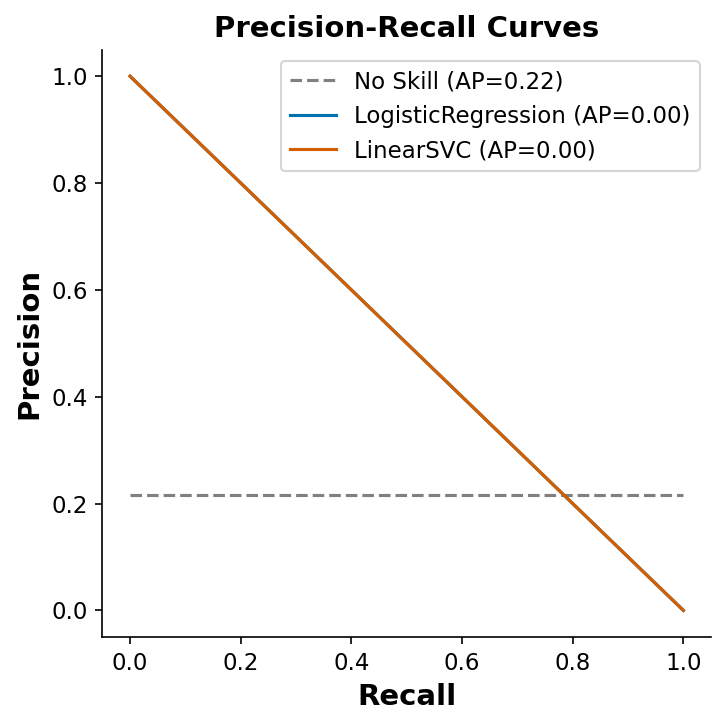

Gaze directionality plot saved to gaze_following_output\gaze_directionality.png
Gaze directionality plot saved to gaze_following_output\gaze_directionality.pdf


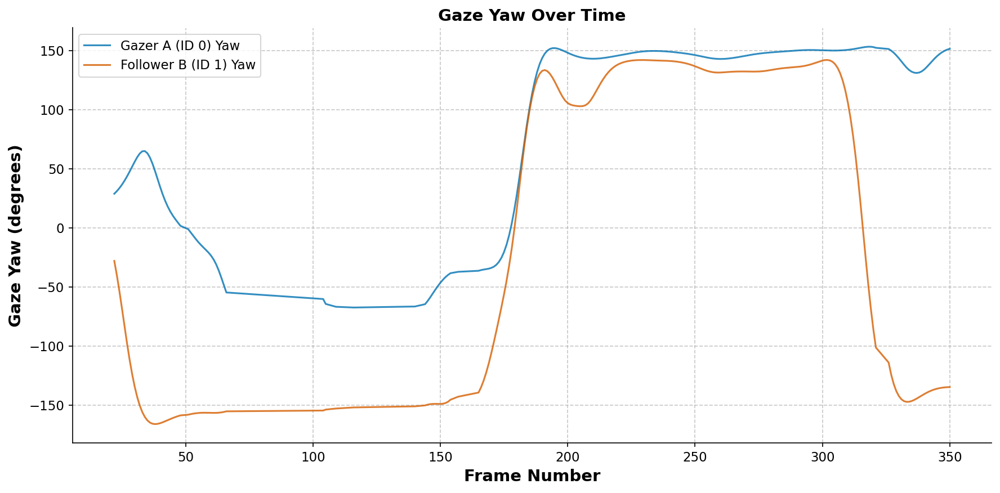

Gaze eccentricity plot saved to gaze_following_output\gaze_eccentricity.png
Gaze eccentricity plot saved to gaze_following_output\gaze_eccentricity.pdf


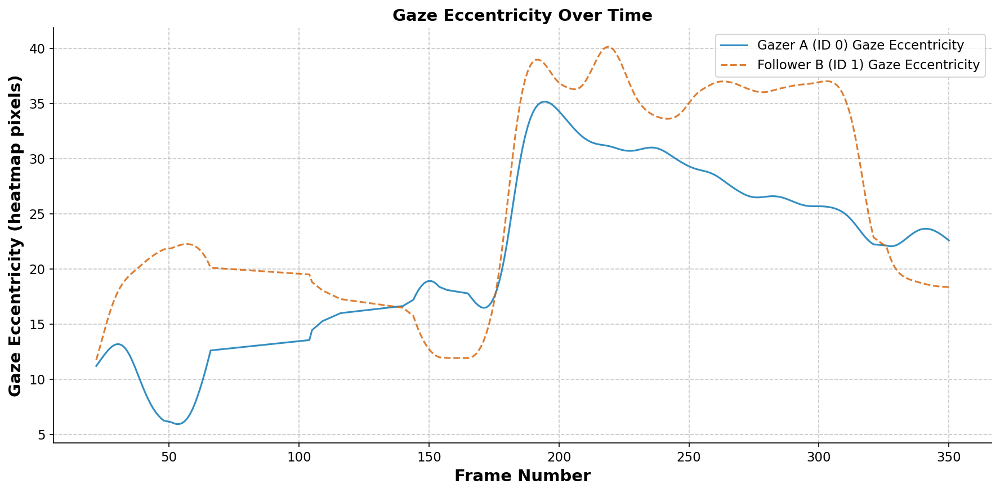

Dynamics plot saved to gaze_following_output\dynamics_events.png
Dynamics plot also saved to gaze_following_output\dynamics_events.pdf


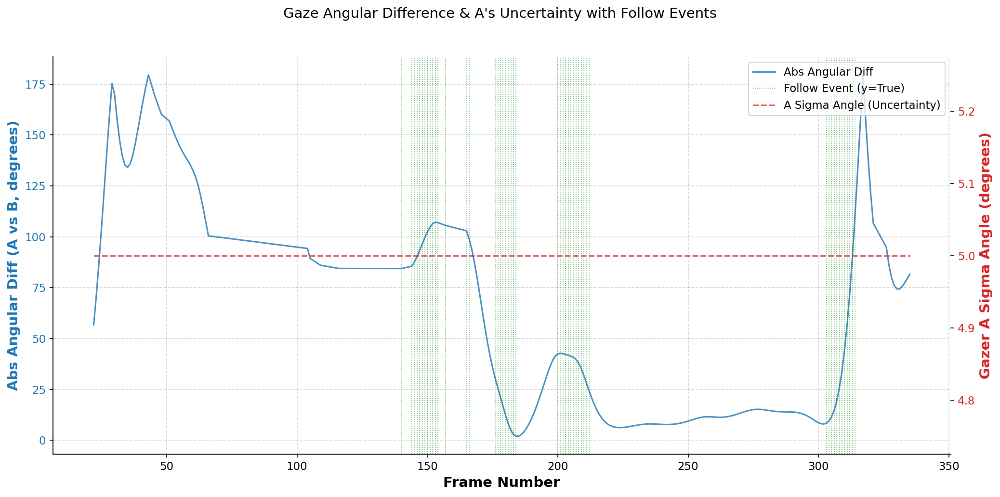


--- Cross-Correlation Analysis (max lag: +/- 2.0s) ---


  Yaw A vs. Yaw B: Max abs correlation = 0.837 at 0.60s lag.
    (Interpretation: If lag is positive, S1 leads S2 by 0.60s. If negative, S2 leads S1 by 0.60s.)


  Yaw Velocity A vs. Yaw Velocity B: Max abs correlation = 0.549 at 0.32s lag.
    (Interpretation: If lag is positive, S1 leads S2 by 0.32s. If negative, S2 leads S1 by 0.32s.)


  Gaze Eccentricity A vs. Eccentricity B: Max abs correlation = 0.782 at 0.00s lag.
    (Interpretation: If lag is positive, S1 leads S2 by 0.00s. If negative, S2 leads S1 by 0.00s.)


  Yaw A vs. B's Offset from A: Max abs correlation = -0.447 at -0.24s lag.
    (Interpretation: If lag is positive, S1 leads S2 by 0.24s. If negative, S2 leads S1 by 0.24s.)


  Distance vs. Signed Relative Yaw: Max abs correlation = -0.653 at -0.88s lag.
    (Interpretation: If lag is positive, S1 leads S2 by 0.88s. If negative, S2 leads S1 by 0.88s.)


Gaze sequence plot saved to gaze_following_output\sequence_follow_sequence.png


Gaze sequence plot also saved to gaze_following_output\sequence_follow_sequence.pdf


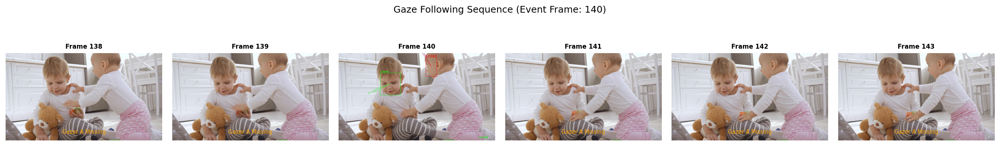

Gaze sequence plot saved to gaze_following_output\sequence_nofollow_sequence.png


Gaze sequence plot also saved to gaze_following_output\sequence_nofollow_sequence.pdf


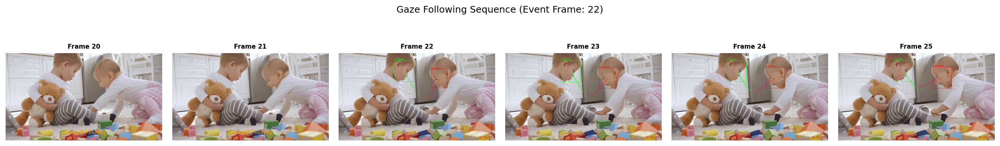

Using frame 226 as background for attention cloud (Primate 0).


Accumulating Attention Cloud (Primate 0):   0%|          | 0/242 [00:00<?, ?it/s]

Attention cloud for Primate 0 saved to gaze_following_output\attention_cloud_primate_0.png


Attention cloud for Primate 0 also saved to gaze_following_output\attention_cloud_primate_0.pdf


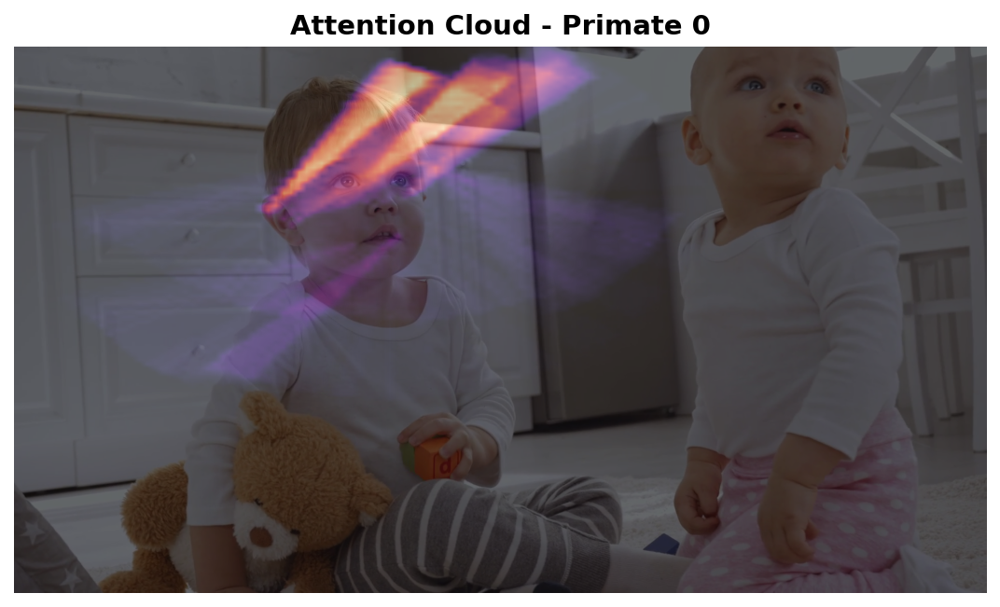

Using frame 226 as background for combined attention cloud.


Accumulating Cloud for Primate 0:   0%|          | 0/242 [00:00<?, ?it/s]

Accumulating Cloud for Primate 1:   0%|          | 0/242 [00:00<?, ?it/s]

Combined attention cloud saved to gaze_following_output\combined_attention_cloud_primates_0_1.png


Combined attention cloud also saved to gaze_following_output\combined_attention_cloud_primates_0_1.pdf


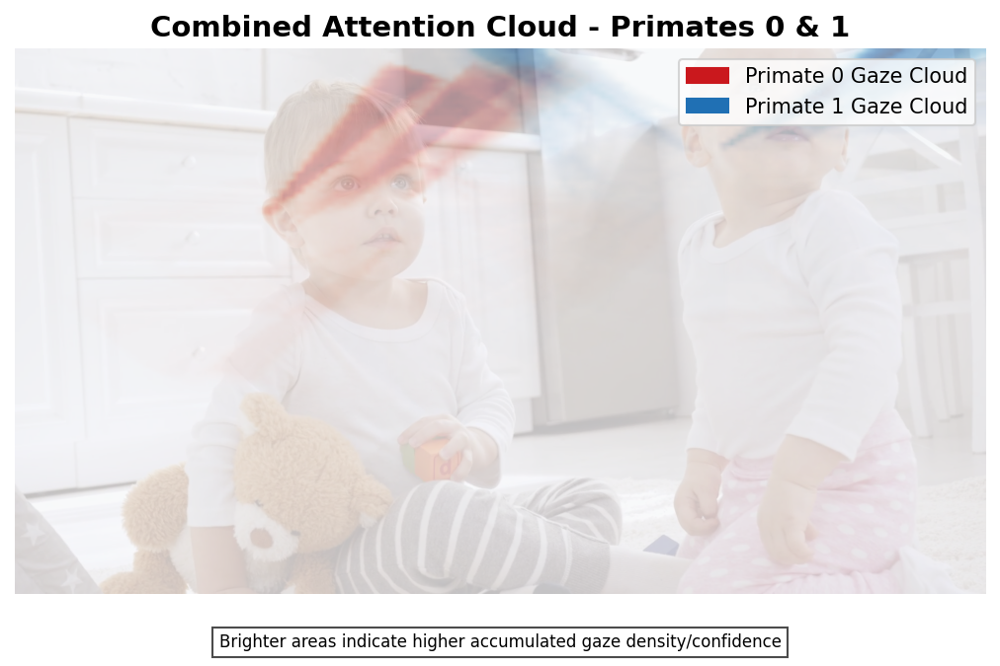

Generating qualitative video: gaze_following_output\gaze_following_annotated.mp4


  0%|          | 0/300 [00:00<?, ?it/s]

Finished generating video: gaze_following_output\gaze_following_annotated.mp4

--- Processing Finished ---


In [10]:
# Analysis Parameters
det_thr = 0.5
turn_thresh_degrees = 20
horizon_frames = 15

# Data Continuity Filter
min_lookback_frames = 5
min_lookahead_A_frames = 5

# Output Configuration
run_training = True
generate_plots = True
generate_video = True

if not VIDEO_FILE_PATH or not Path(VIDEO_FILE_PATH).exists():
    print("ERROR: Video path not set. Please update VIDEO_FILE_PATH in cell 6.")
else:
    config = {
        "video": VIDEO_FILE_PATH,
        "output_dir": output_dir,
        "device": DEVICE,
        "det_thr": det_thr,
        "horizon": horizon_frames,
        "min_lookback": min_lookback_frames,
        "min_lookahead_A": min_lookahead_A_frames,
        "det_config": DET_CONFIG_PATH,
        "det_checkpoint": DET_CHECKPOINT_PATH,
        "gazelle_model_name": GAZELLE_MODEL_NAME,
        "gazelle_checkpoint": GAZELLE_CHECKPOINT_PATH,
    }

    os.makedirs(config['output_dir'], exist_ok=True)
    print("Outputs will be saved to: " + config['output_dir'])

    # --- Step 1: Process video ---
    df_raw, fps = process_video(config['video'], config)

    # --- Step 2: Filter continuous segments ---
    min_lookahead_B_val = max(config['horizon'], 1)
    df_filtered = filter_continuous_segments(
        df_raw, config['min_lookback'],
        config['min_lookahead_A'], min_lookahead_B_val
    )

    if df_filtered.empty:
        print()
        print("No continuous interaction segments found. Analysis cannot proceed.")
    else:
        # --- Step 3: Feature engineering ---
        df_features = engineer_advanced_features(df_filtered.copy(), fps)
        X, y = label_follow_events(
            df_features, fps,
            horizon=config['horizon'],
            turn_thresh=turn_thresh_degrees,
        )

        # --- Step 4: Train classifiers ---
        results = {}
        if run_training and X.shape[0] > 0 and len(np.unique(y)) > 1:
            results = train_eval(X, y)

            if generate_plots:
                pr_curve_plot(
                    results, y,
                    os.path.join(config['output_dir'], 'pr_curve.png'),
                )
        else:
            print()
            print("Skipping model training (insufficient data or disabled).")

        # --- Step 5: Plots ---
        if generate_plots:
            plot_gaze_directionality(
                df_filtered,
                os.path.join(config['output_dir'], 'gaze_directionality.png'),
            )
            plot_gaze_eccentricity(
                df_filtered,
                os.path.join(config['output_dir'], 'gaze_eccentricity.png'),
            )
            if X.shape[0] > 0 and y.shape[0] > 0:
                plot_dynamics_with_follow_events(
                    df_filtered, X, y, config['horizon'],
                    os.path.join(config['output_dir'], 'dynamics_events.png'),
                )
            analyze_gaze_cross_correlation(
                df_features, fps,
                os.path.join(config['output_dir'], 'cross_correlations'),
            )

            # Plot example sequences
            true_indices = np.where(y)[0] if len(y) > 0 else []
            if len(true_indices) > 0:
                plot_gaze_sequence(
                    [df_filtered.index[true_indices[0]]],
                    config['video'], df_filtered, y,
                    os.path.join(config['output_dir'], 'sequence_follow'),
                    horizon=config['horizon'],
                )
            false_indices = np.where(~y)[0] if len(y) > 0 else []
            if len(false_indices) > 0:
                plot_gaze_sequence(
                    [df_filtered.index[false_indices[0]]],
                    config['video'], df_filtered, y,
                    os.path.join(config['output_dir'], 'sequence_nofollow'),
                    horizon=config['horizon'],
                )

            # Attention Clouds
            generate_attention_cloud(
                df_filtered, 0, config['video'], config['output_dir'],
            )
            generate_combined_attention_cloud(
                df_filtered, config['video'], config['output_dir'],
            )

        # --- Step 6: Annotated video ---
        if generate_video:
            generate_qualitative_gaze_video(
                config['video'], df_filtered, y,
                os.path.join(config['output_dir'], 'gaze_following_annotated.mp4'),
            )

    print()
    print("--- Processing Finished ---")

## 5. Results & Visualization

Displaying 13 generated plots:

--- attention_cloud_primate_0.png ---


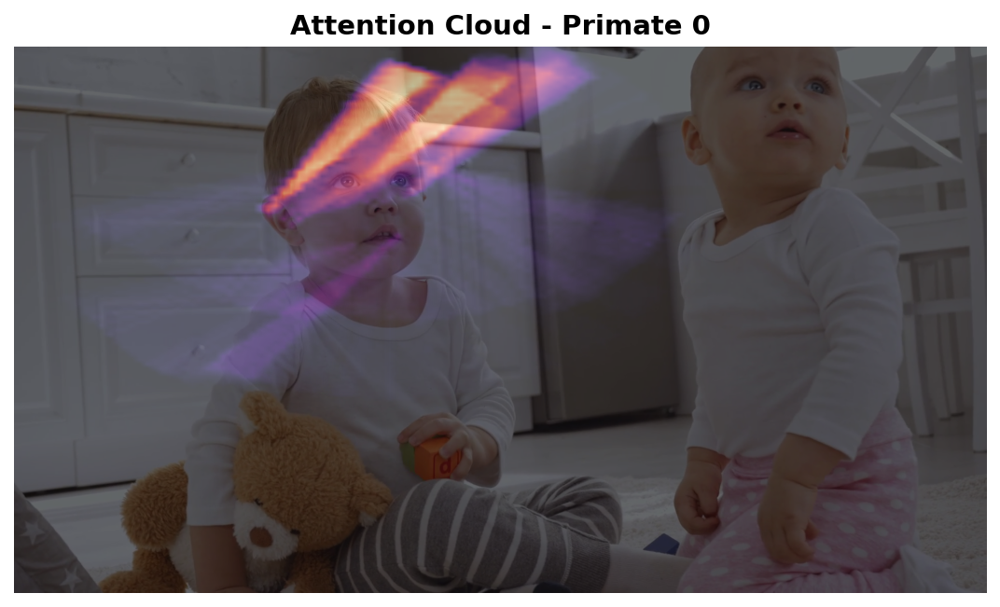


--- combined_attention_cloud_primates_0_1.png ---


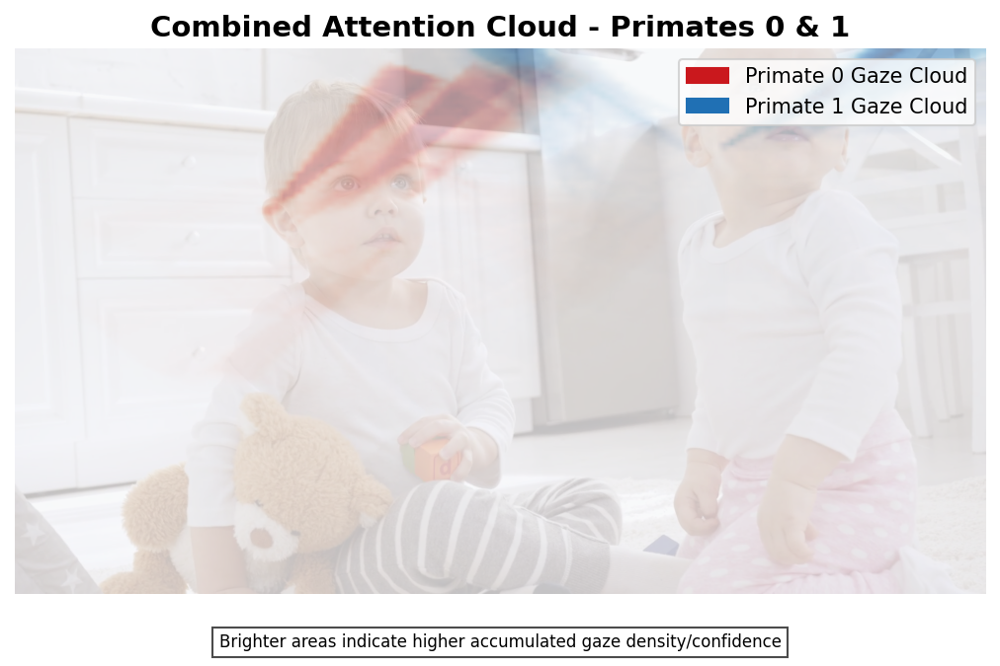


--- xcorr_'gaze_eccentricity'_0_vs_'gaze_eccentricity'_1.png ---


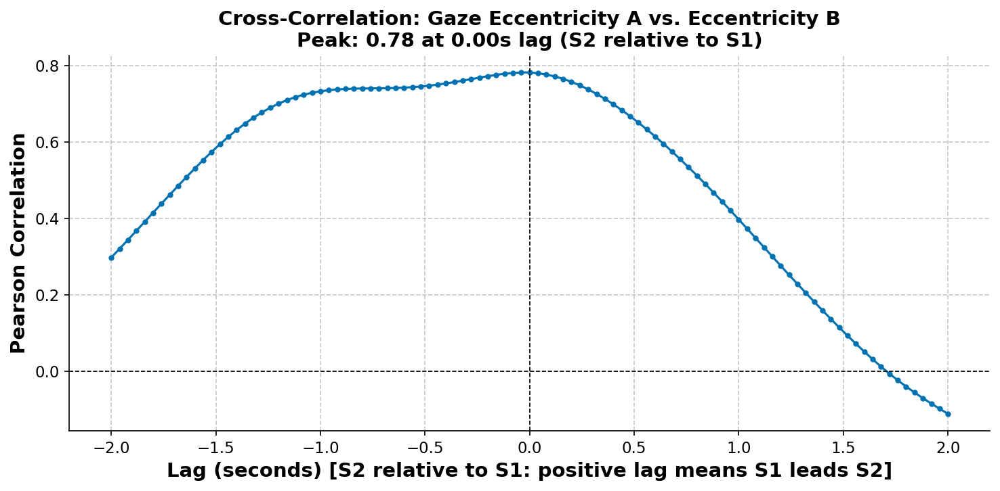


--- xcorr_'yaw'_0_vs_'yaw'_1.png ---


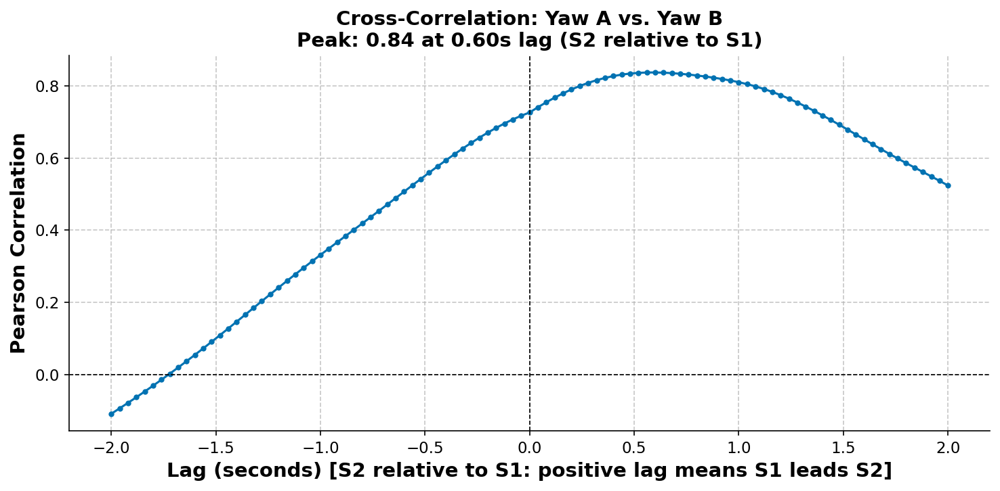


--- xcorr_'yaw'_0_vs_B_looks_at_A_offset_deg.png ---


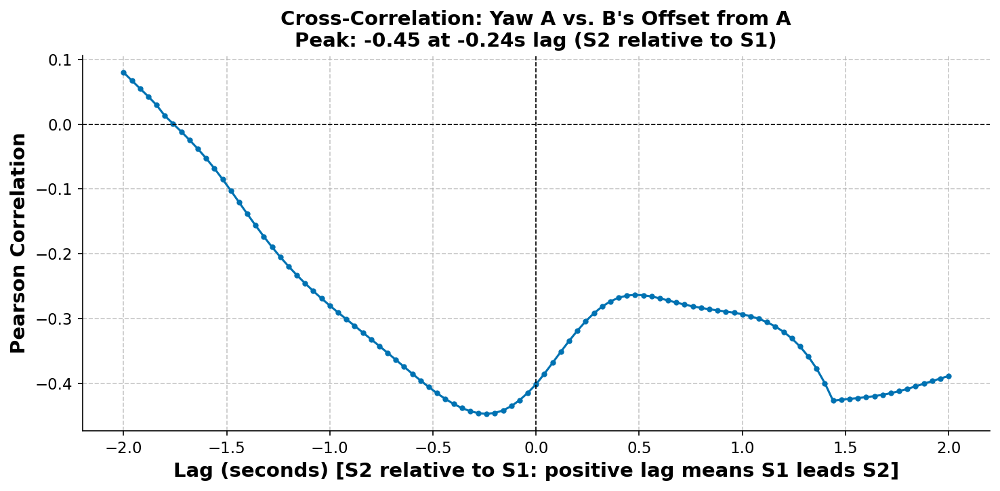


--- xcorr_'yaw_velocity'_0_vs_'yaw_velocity'_1.png ---


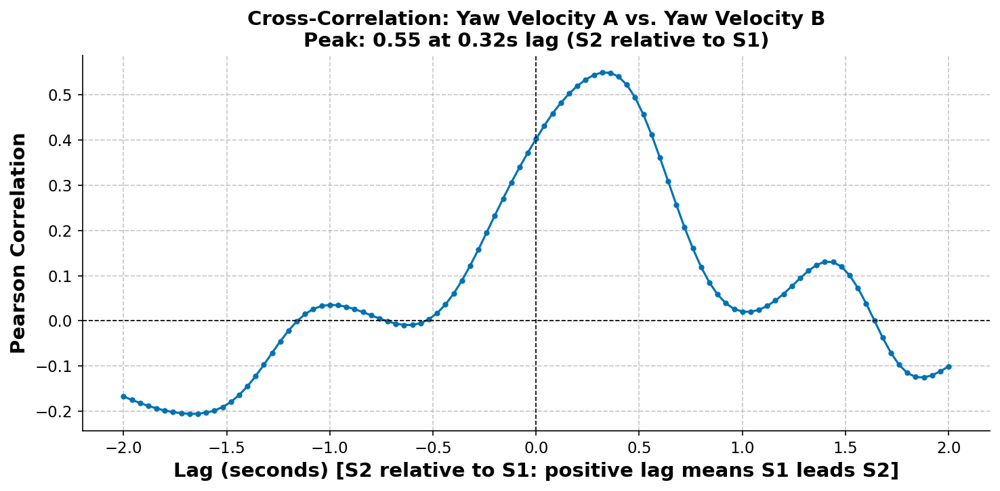


--- xcorr_distance_bbox_centers_vs_signed_relative_yaw_deg.png ---


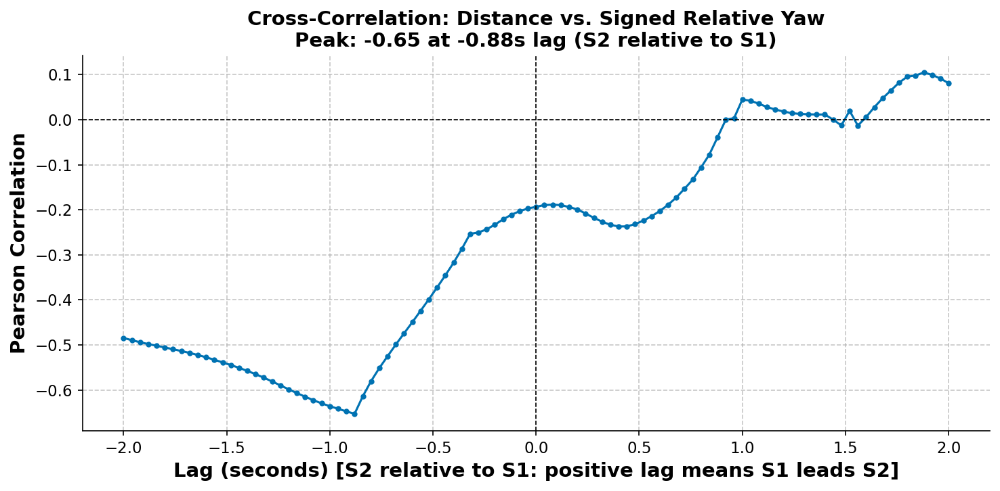


--- dynamics_events.png ---


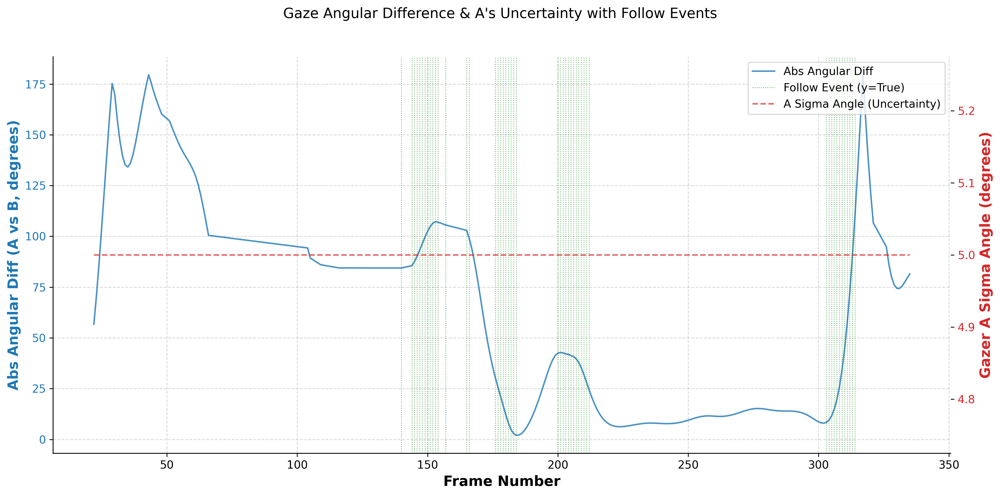


--- gaze_directionality.png ---


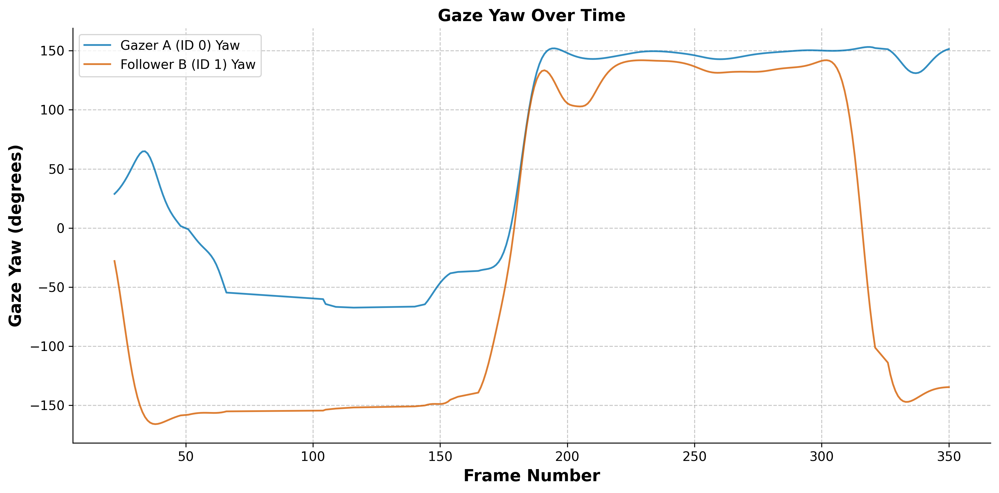


--- gaze_eccentricity.png ---


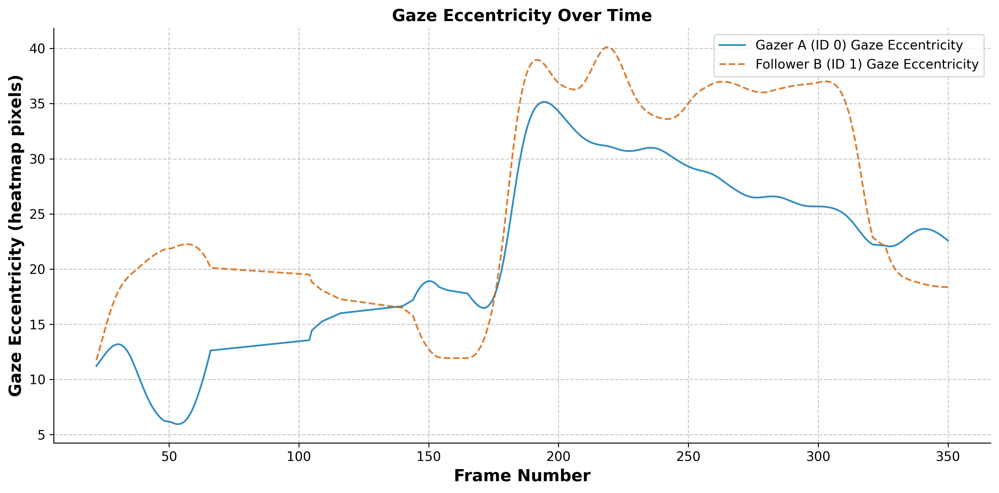


--- pr_curve.png ---


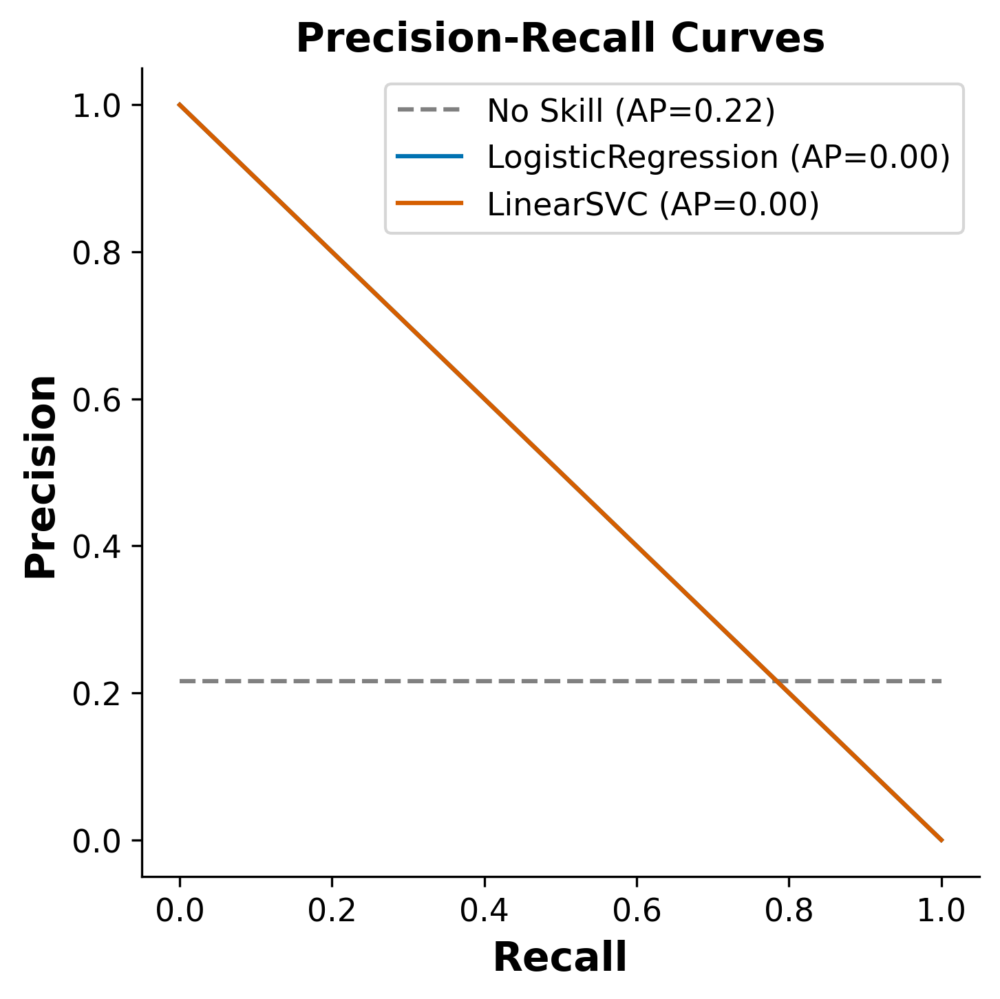


--- sequence_follow_sequence.png ---


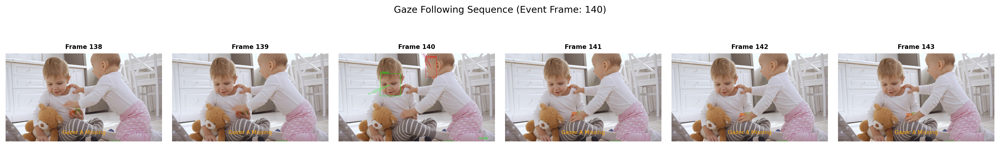


--- sequence_nofollow_sequence.png ---


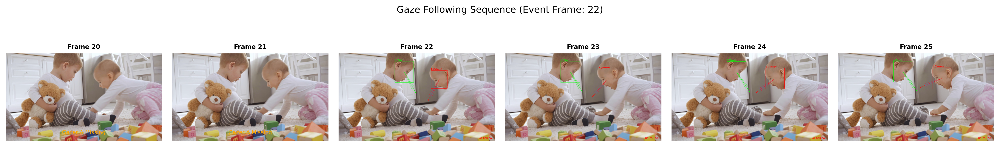

In [11]:
from IPython.display import Image, display

figure_dir = Path(output_dir)
png_files = sorted(figure_dir.glob('**/*.png'))

if not png_files:
    print("No figures found. Run the analysis cell first.")
else:
    print("Displaying " + str(len(png_files)) + " generated plots:")
    for img_path in png_files:
        print()
        print("--- " + img_path.name + " ---")
        display(Image(filename=str(img_path), width=800))

## 6. Summary and Next Steps

### What we accomplished:
1. Used a face detector with ByteTracker to track two primates.
2. Applied Gazelle to estimate gaze direction and uncertainty.
3. Trained classifiers to predict gaze-following events.
4. Generated visualizations: PR curves, gaze dynamics, attention clouds.

### Next steps:
- Try different videos with two primates
- Adjust `det_thr`, `turn_thresh_degrees`, and `horizon_frames` parameters
- Explore the cross-correlation and gaze prediction outputs
- Use the attention cloud to identify spatial gaze hotspots


## Citation

If you use PrimateFace in your research, please cite:

```bibtex
@article{parodi2025primateface,
  title   = {PrimateFace: A Machine Learning Resource for Automated Face Analysis in Human and Non-human Primates},
  author  = {Parodi, Felipe and Matelsky, Jordan K. and Lamacchia, Alessandro P. and Segado, Melanie and Jiang, Yaoguang and Regla-Vargas, Alejandra and Sofi, Liala and Kimock, Clare and Waller, Bridget M. and Platt, Michael L. and Kording, Konrad P.},
  journal = {bioRxiv},
  year    = {2025},
  doi     = {10.1101/2025.08.12.669927}
}
```